In [1]:
library(tidyverse)
library(maps)
library(forcats)
library(caret)
library(DT)

── Attaching packages ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.2     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘maps’


The following object is masked from ‘package:purrr’:

    map


Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift




In [2]:
df_pulsar <- read_csv("HTRU_2.csv", col_names = FALSE)

names(df_pulsar) <- c("integ_mean","integ_sd","integ_exkur","integ_skew",
                      "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

df_pulsar <- df_pulsar %>% select(everything()) %>% mutate(Class = ifelse(Class == 1, "Pulsar", "Non Pulsar"))

df_pulsar$Class <- as.factor(df_pulsar$Class)


── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double(),
  X4 = col_double(),
  X5 = col_double(),
  X6 = col_double(),
  X7 = col_double(),
  X8 = col_double(),
  X9 = col_double()
)




tibble [17,898 × 9] (S3: tbl_df/tbl/data.frame)
 $ integ_mean : num [1:17898] 140.6 102.5 103 136.8 88.7 ...
 $ integ_sd   : num [1:17898] 55.7 58.9 39.3 57.2 40.7 ...
 $ integ_exkur: num [1:17898] -0.2346 0.4653 0.3233 -0.0684 0.6009 ...
 $ integ_skew : num [1:17898] -0.7 -0.515 1.051 -0.636 1.123 ...
 $ DMSNR_mean : num [1:17898] 3.2 1.68 3.12 3.64 1.18 ...
 $ DMSNR_sd   : num [1:17898] 19.1 14.9 21.7 21 11.5 ...
 $ DMSNR_exkur: num [1:17898] 7.98 10.58 7.74 6.9 14.27 ...
 $ DMSNR_skew : num [1:17898] 74.2 127.4 63.2 53.6 252.6 ...
 $ Class      : Factor w/ 2 levels "Non Pulsar","Pulsar": 1 1 1 1 1 1 1 1 1 1 ...
NULL


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



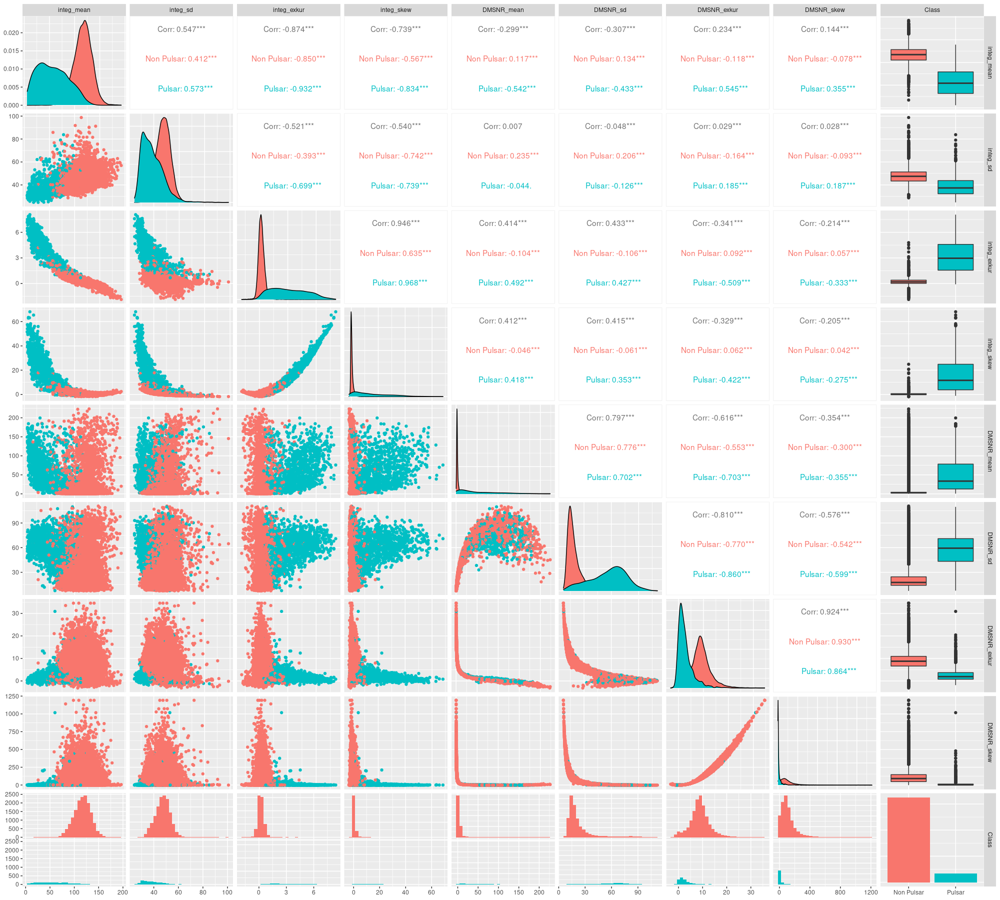

In [3]:
print(str(df_pulsar))

options(repr.plot.width = 20, repr.plot.height = 18, repr.plot.res = 100)

dense_colors <- c('#a6cee3','#1f78b4','#b2df8a','#33a02c', 
                  '#ca0020','#f4a582','#bababa','#404040')

GGally::ggpairs(df_pulsar, mapping = ggplot2::aes(color = Class))

In [4]:
short_names <- list("integ_mean","integ_sd","integ_exkur","integ_skew",
                    "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

proper_names <-  c("Integrated Mean", "Integrated Standard Deviation", 
                   "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                   "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

#names_list <- list(short_names)

names(short_names) <- c(proper_names, "Class")

print(short_names)

$`Integrated Mean`
[1] "integ_mean"

$`Integrated Standard Deviation`
[1] "integ_sd"

$`Integrated Kurtosis`
[1] "integ_exkur"

$`Intergrated Skew`
[1] "integ_skew"

$`DMSNR Mean`
[1] "DMSNR_mean"

$`DMSNR Standard Deviation`
[1] "DMSNR_sd"

$`DMSNR Kurtosis`
[1] "DMSNR_exkur"

$`DMSNR Skew`
[1] "DMSNR_skew"

$Class
[1] "Class"



In [31]:
var_list <- names(df_pulsar)[1:5]

df_pulsar %>% select(all_of(var_list)) %>% filter(integ_mean <= 10) %>% datatable()

HTML widgets cannot be represented in plain text (need html)

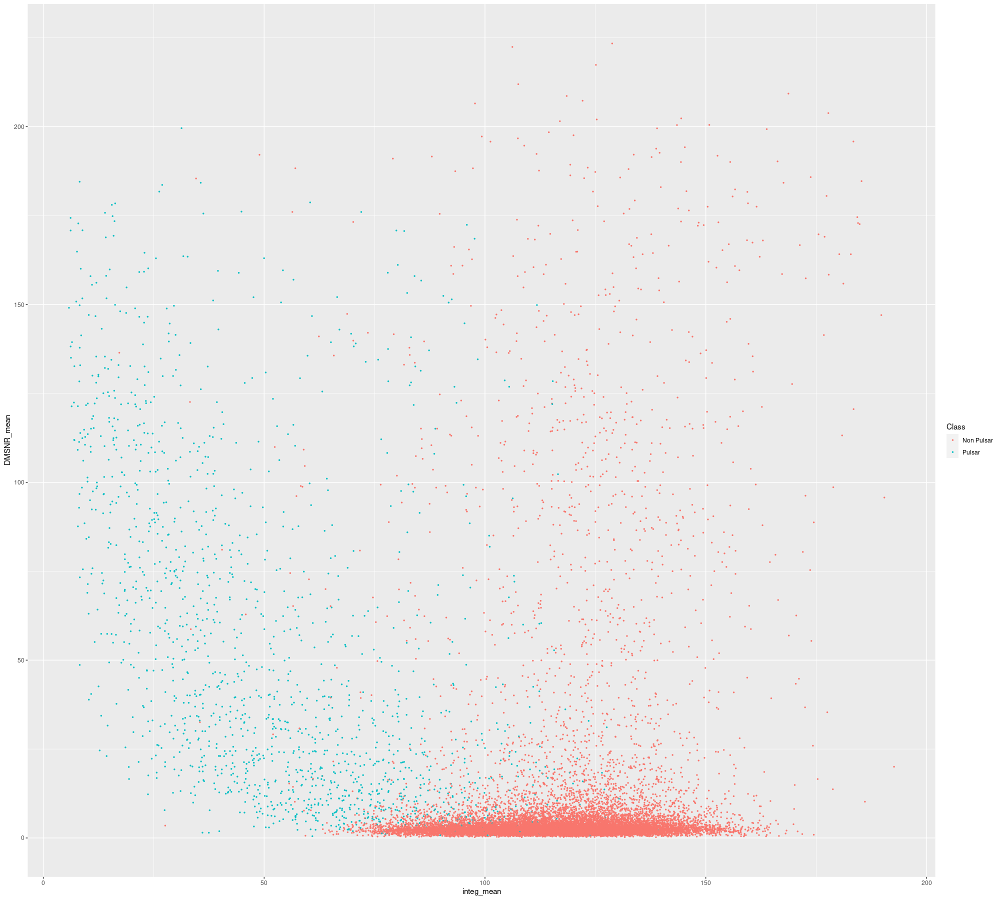

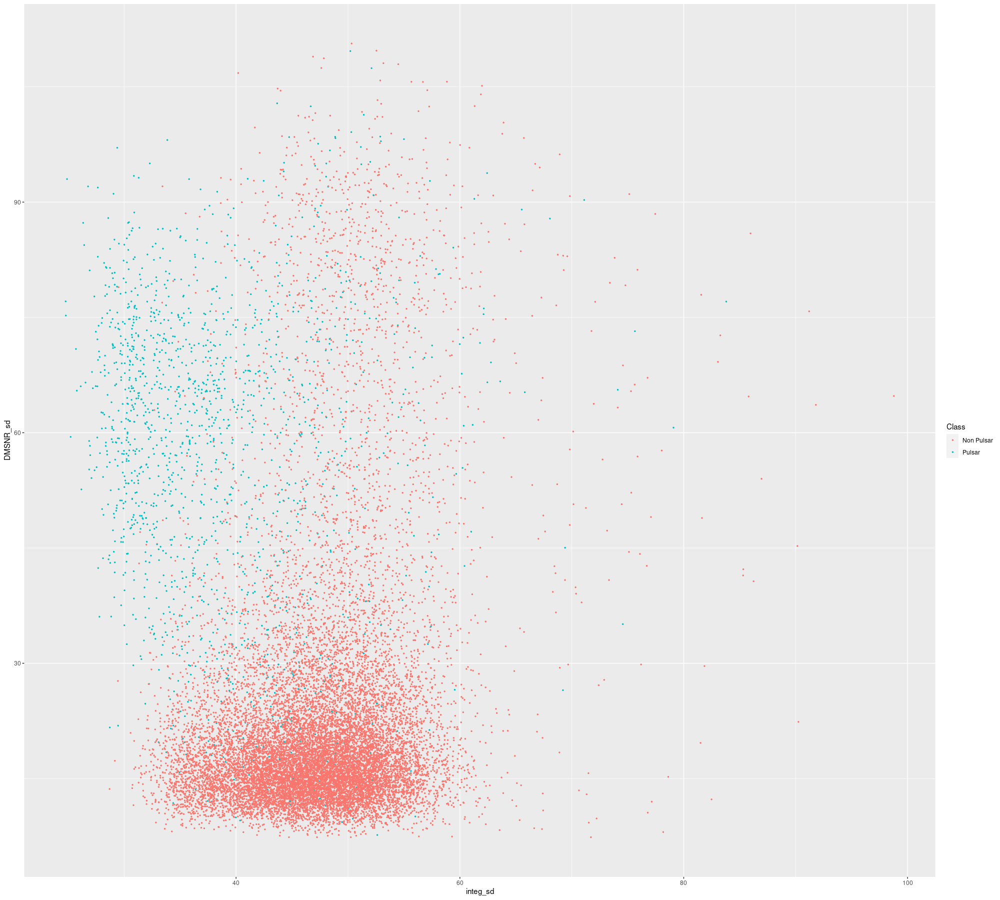

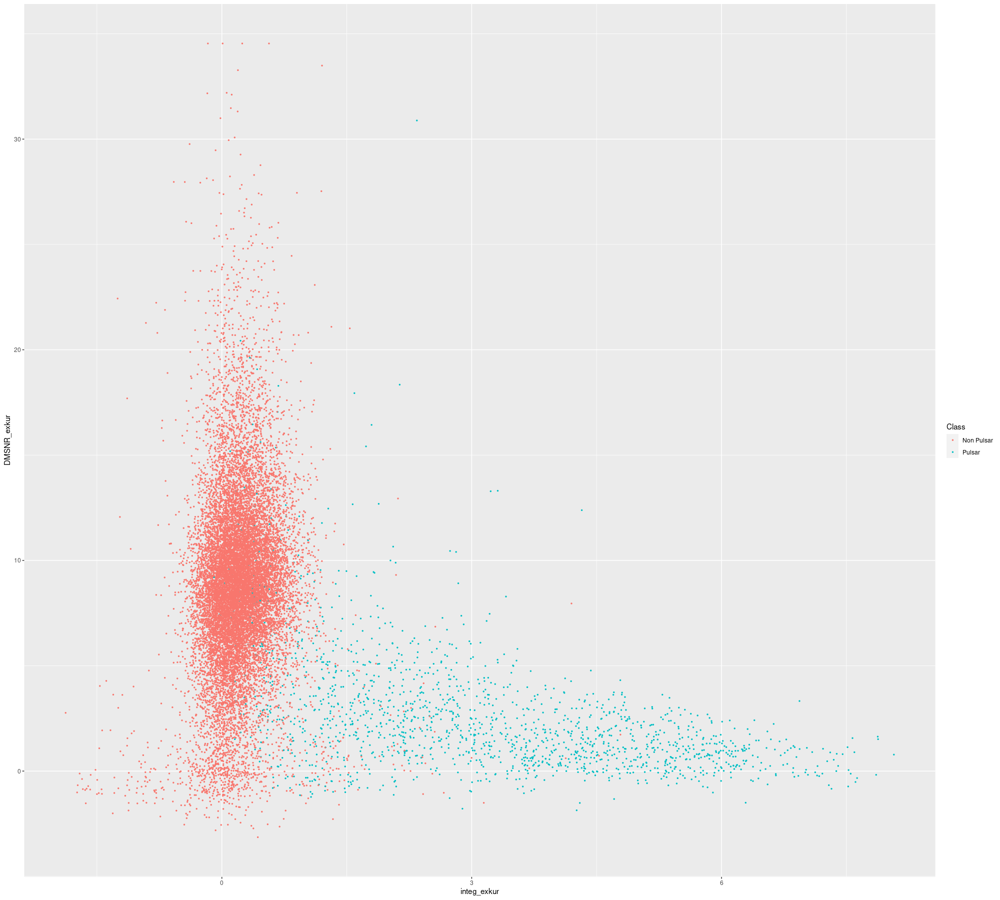

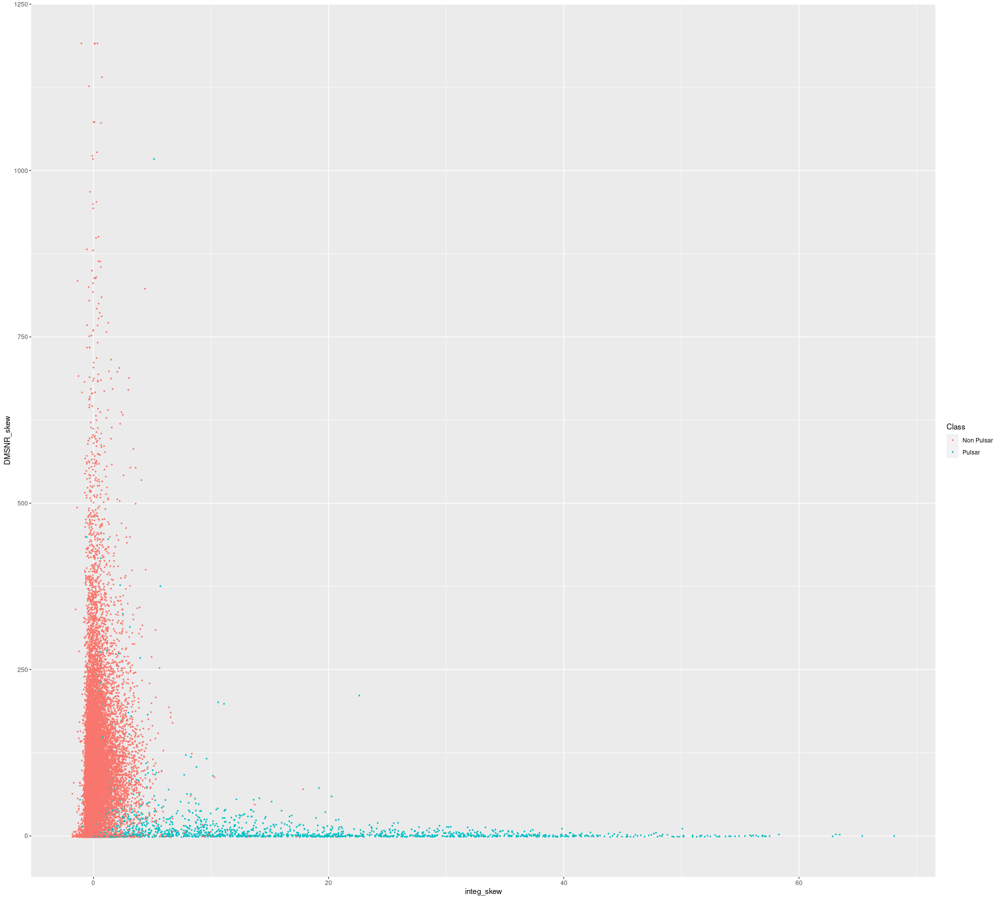

In [6]:
ggplot(df_pulsar, aes(x = integ_mean, y = DMSNR_mean, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_sd, y = DMSNR_sd, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_exkur, y = DMSNR_exkur, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_skew, y = DMSNR_skew, col = Class)) +
  geom_point(size = 0.5)

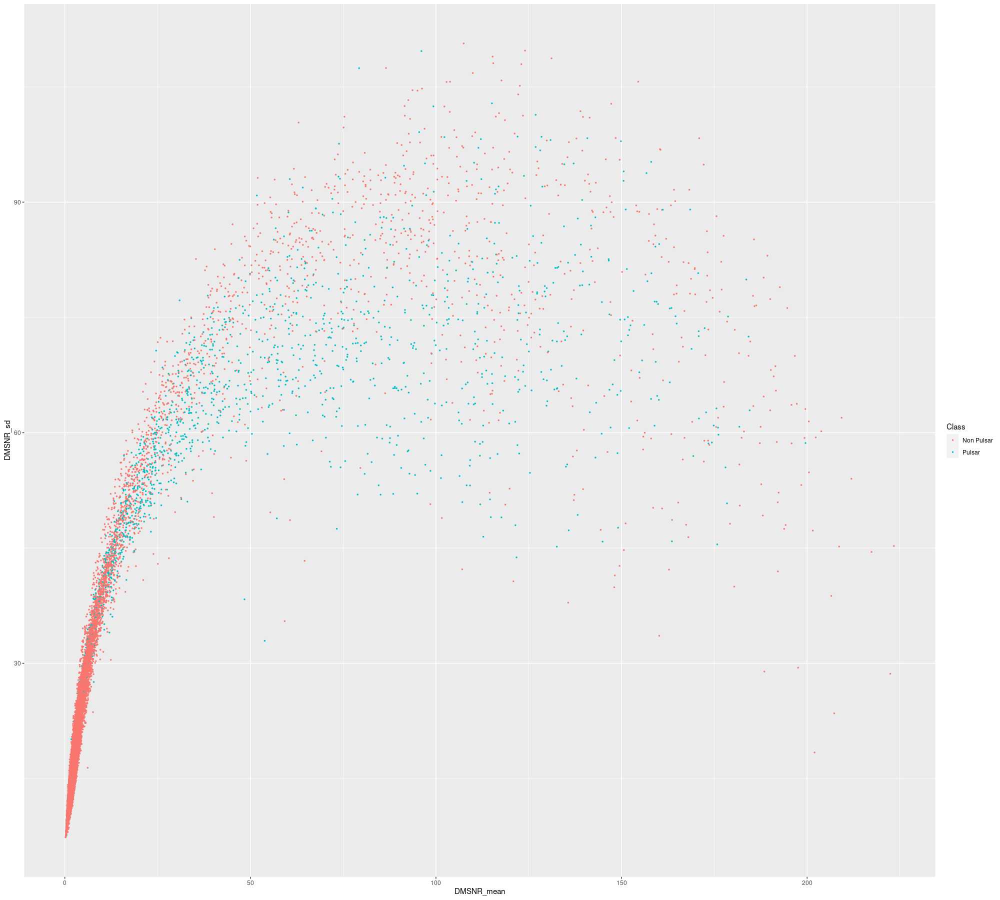

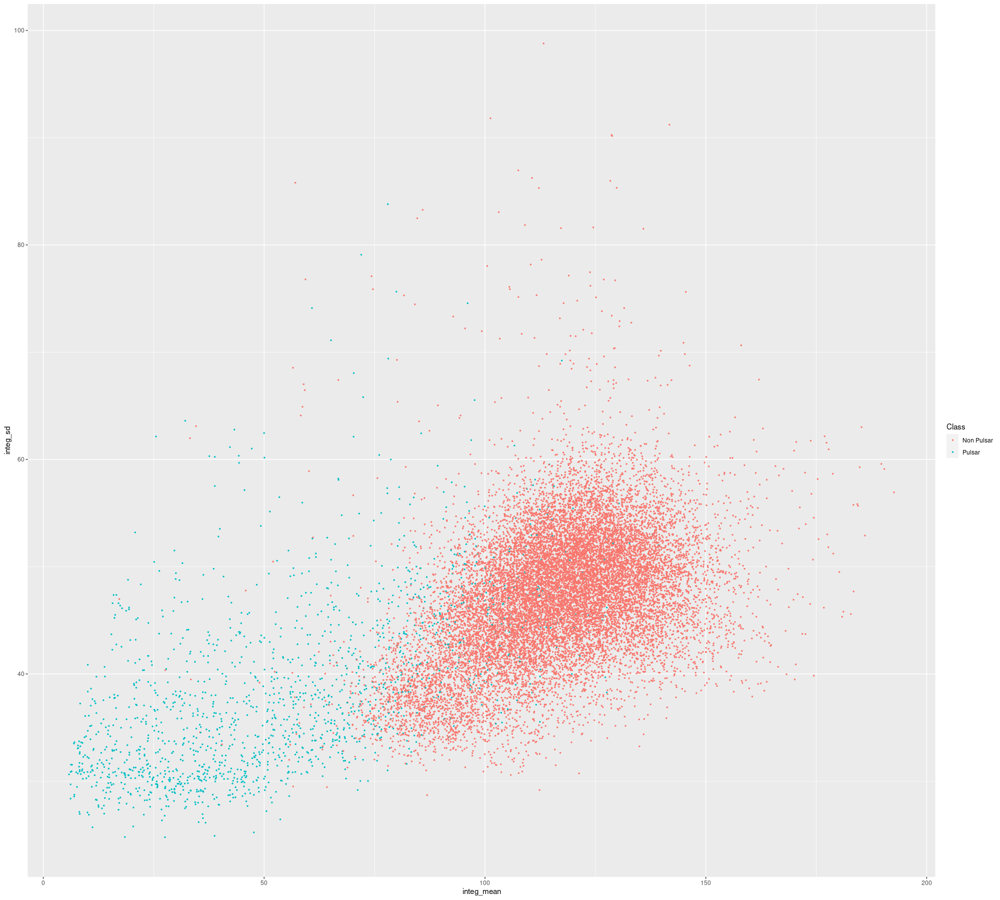

In [5]:
ggplot(df_pulsar, aes(x = DMSNR_mean, y = DMSNR_sd, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_mean, y = integ_sd, col = Class)) +
  geom_point(size = 0.5)

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”
Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


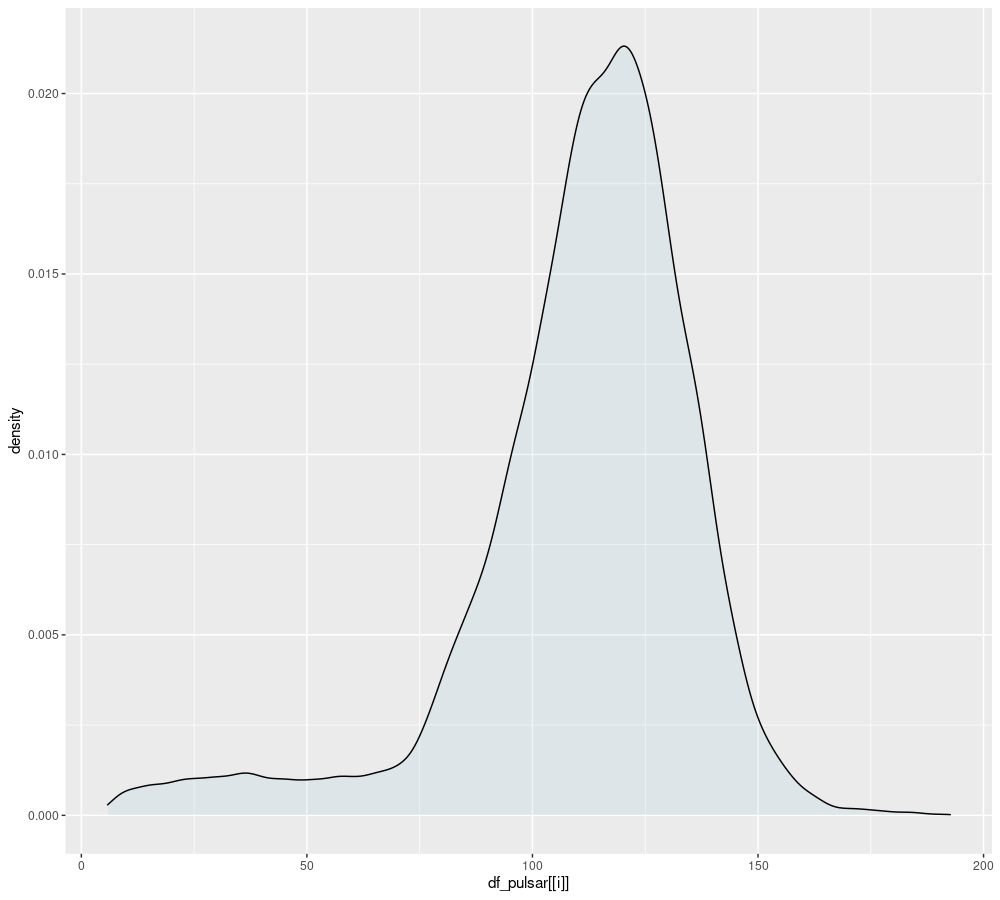

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


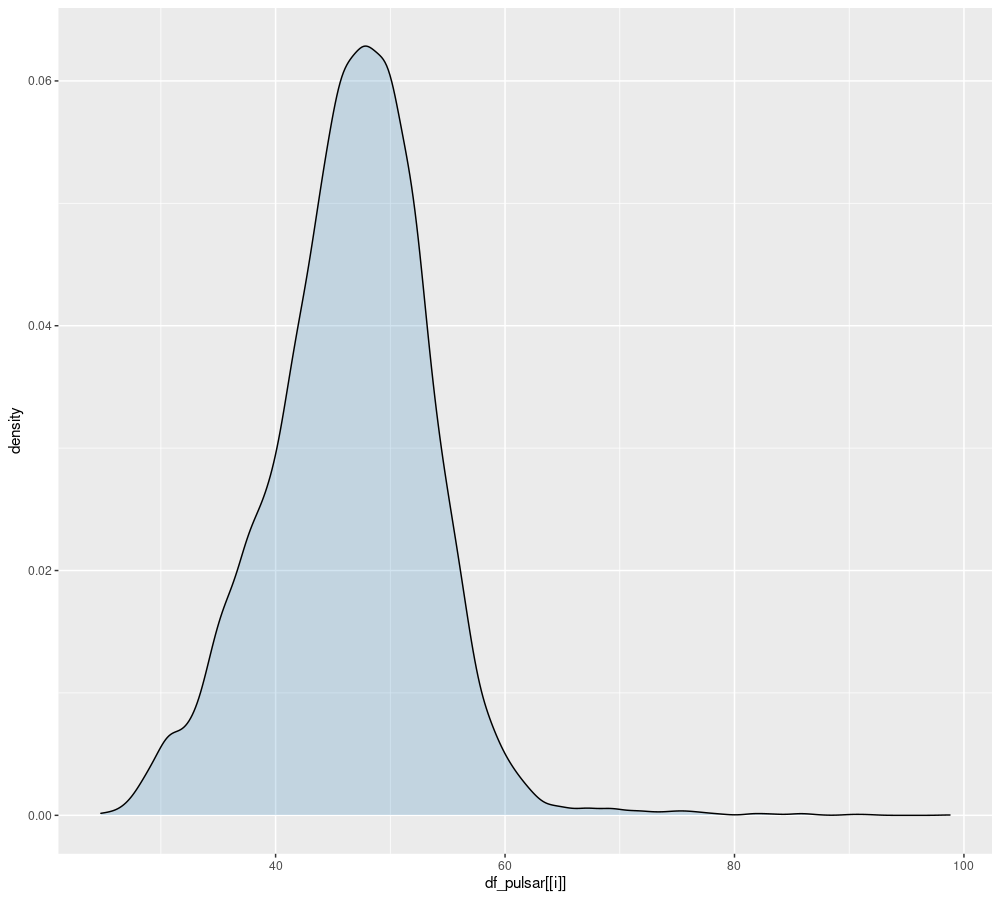

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


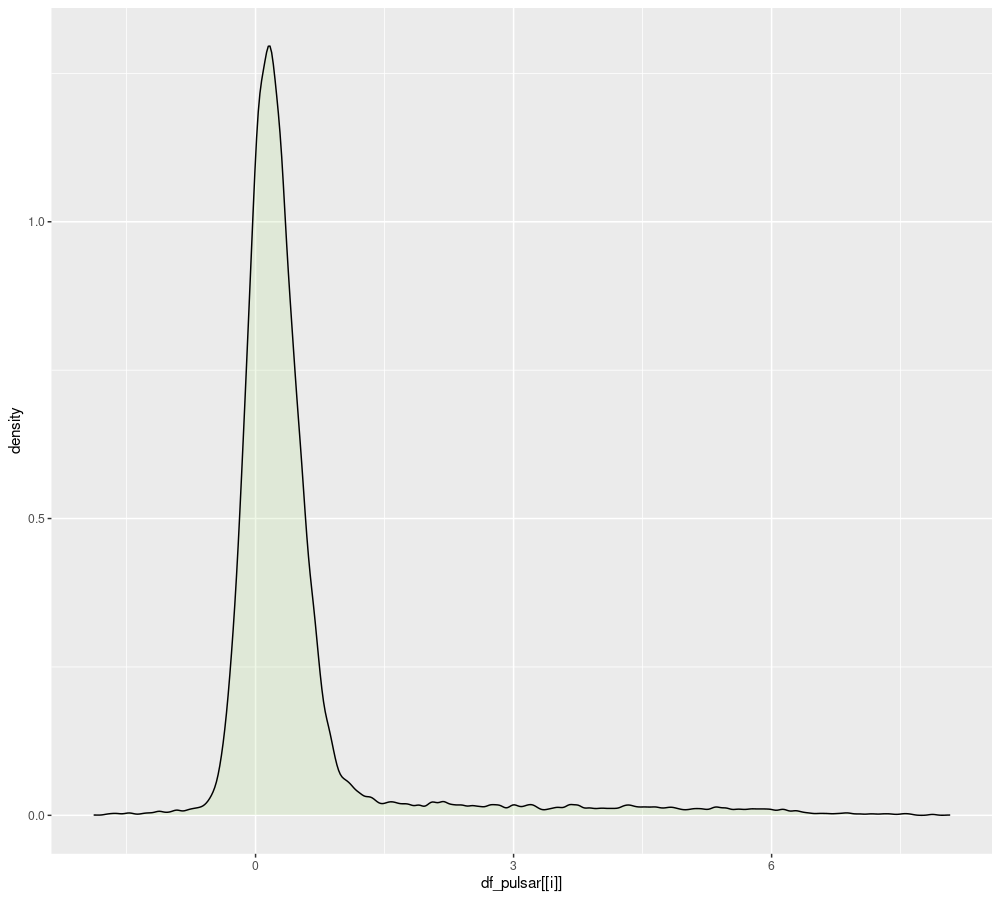

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


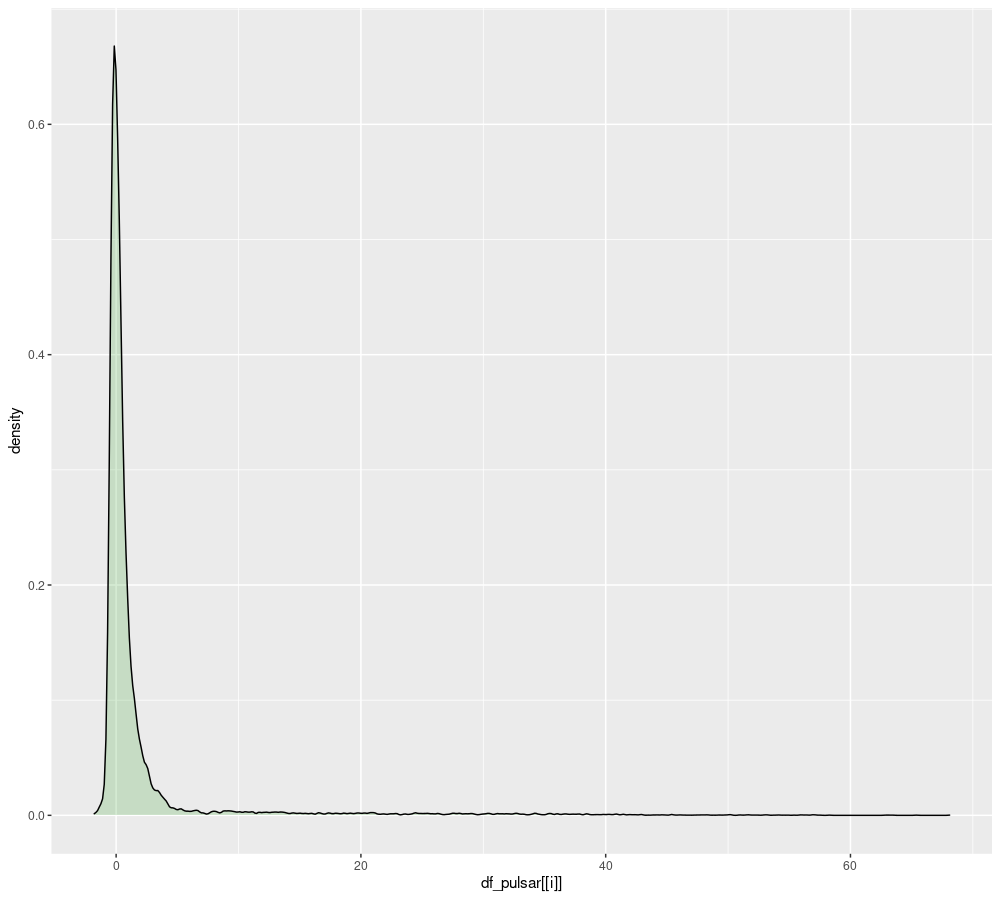

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


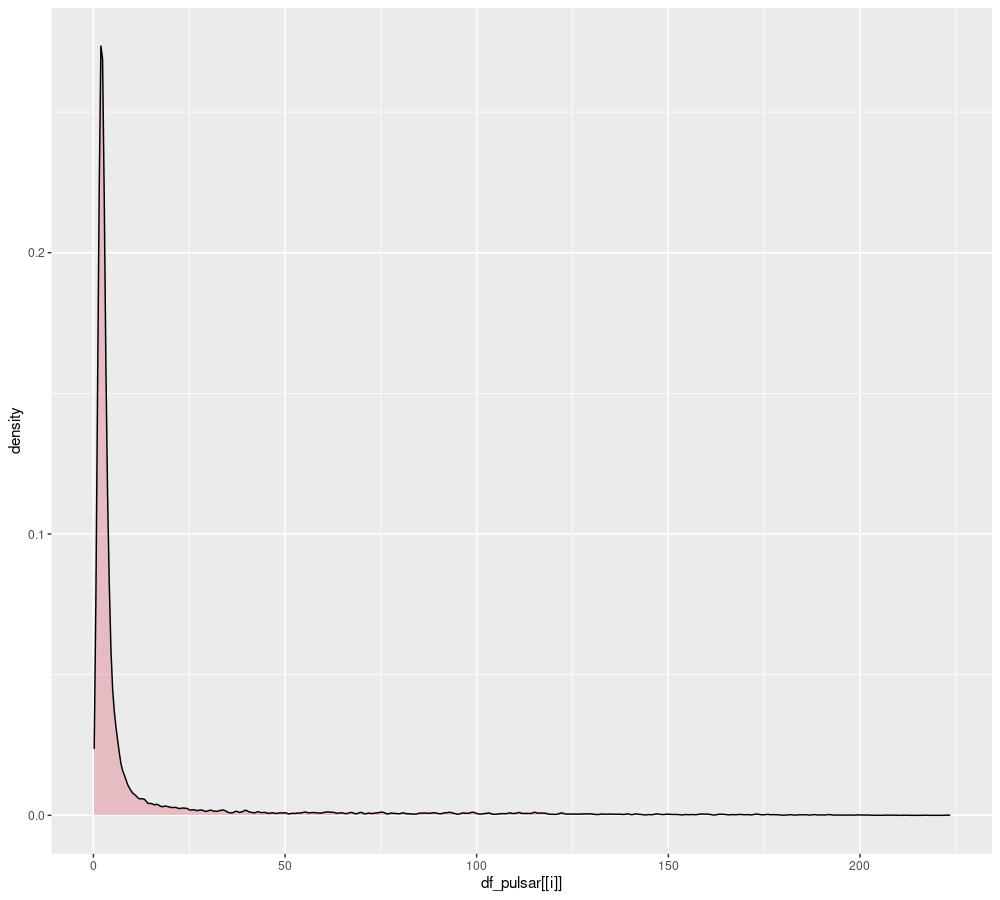

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


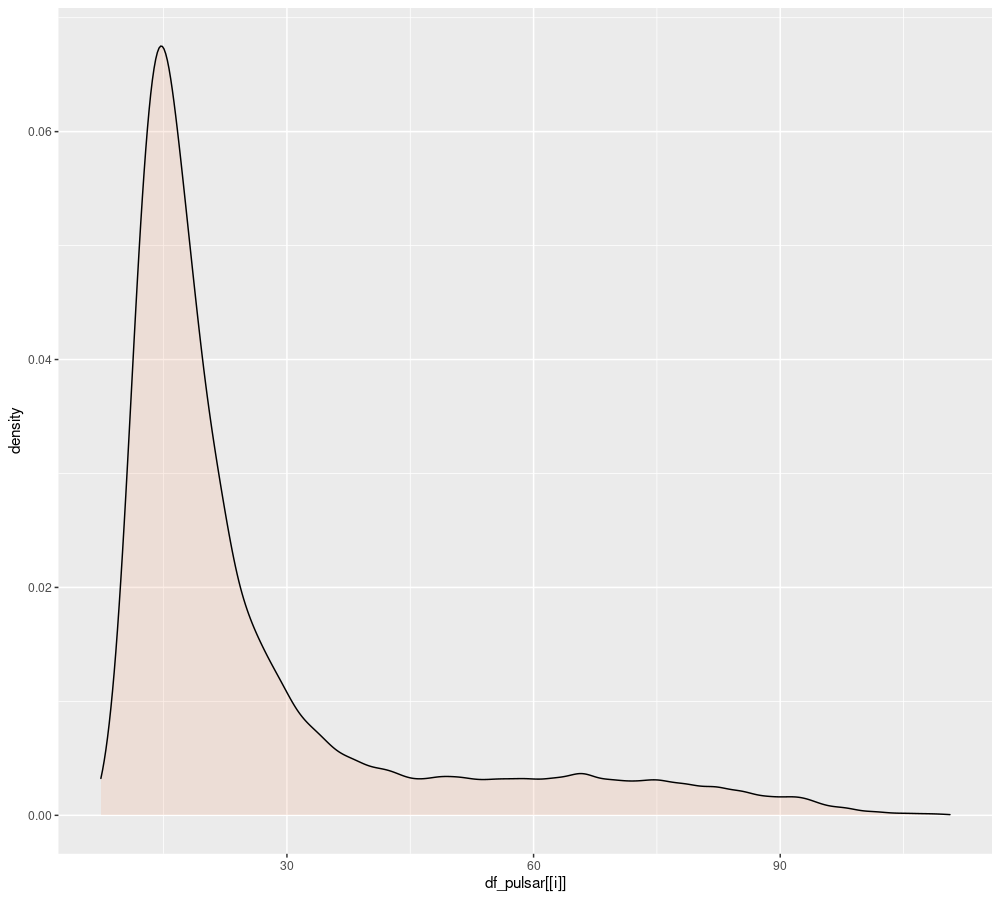

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


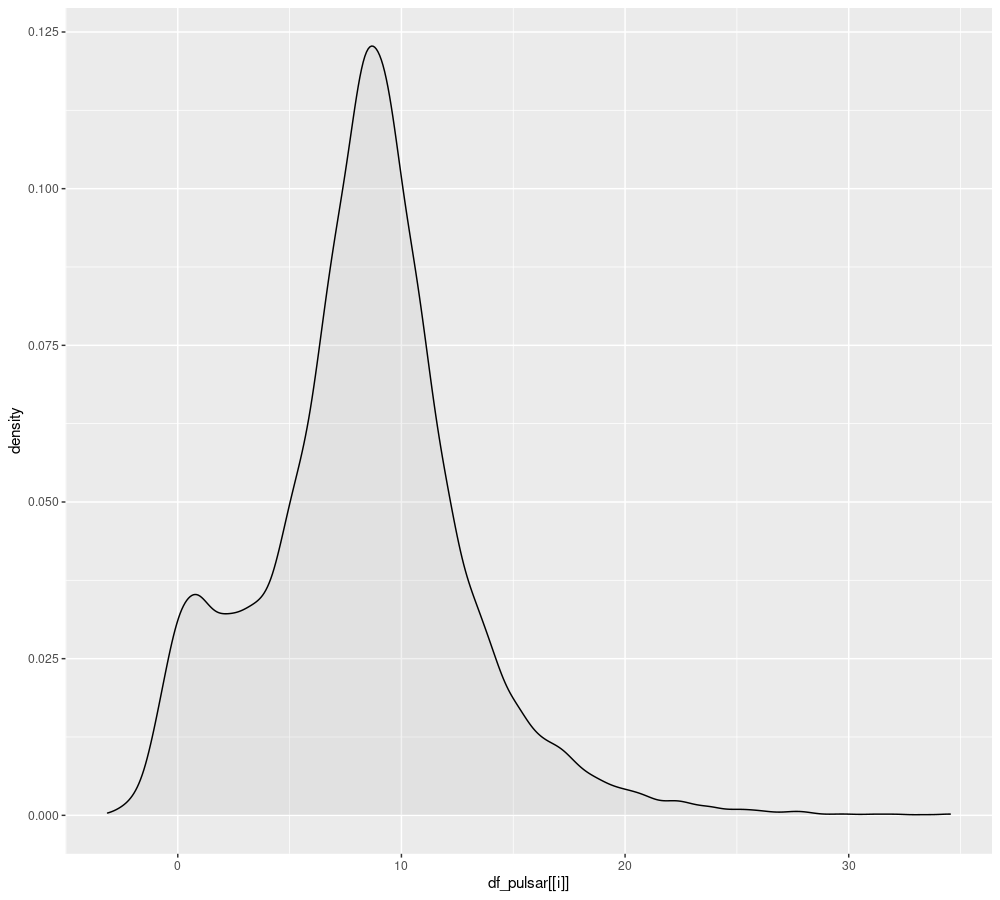

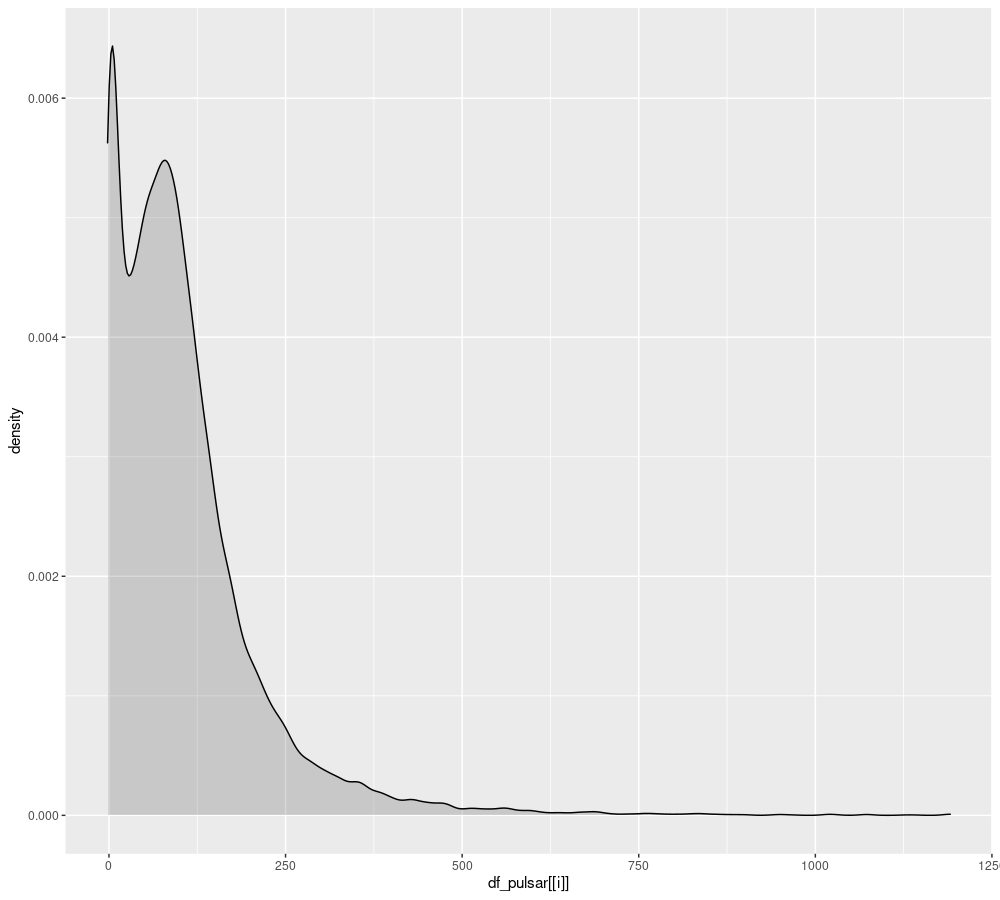

In [7]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

dense_colors <- c('#a6cee3','#1f78b4','#b2df8a','#33a02c', 
                  '#ca0020','#f4a582','#bababa','#404040')


for(i in 1:4){
    pulsar_plot <-
    ggplot(data = df_pulsar) +
    geom_density(aes(x = df_pulsar[[i]]), alpha = .2, fill = dense_colors[i])
    print(pulsar_plot)
}

for(i in 5:8){
    pulsar_plot <-
    ggplot(df_pulsar) +
    geom_density(aes(x = df_pulsar[[i]]), alpha = .2, fill = dense_colors[i])
    print(pulsar_plot)
}

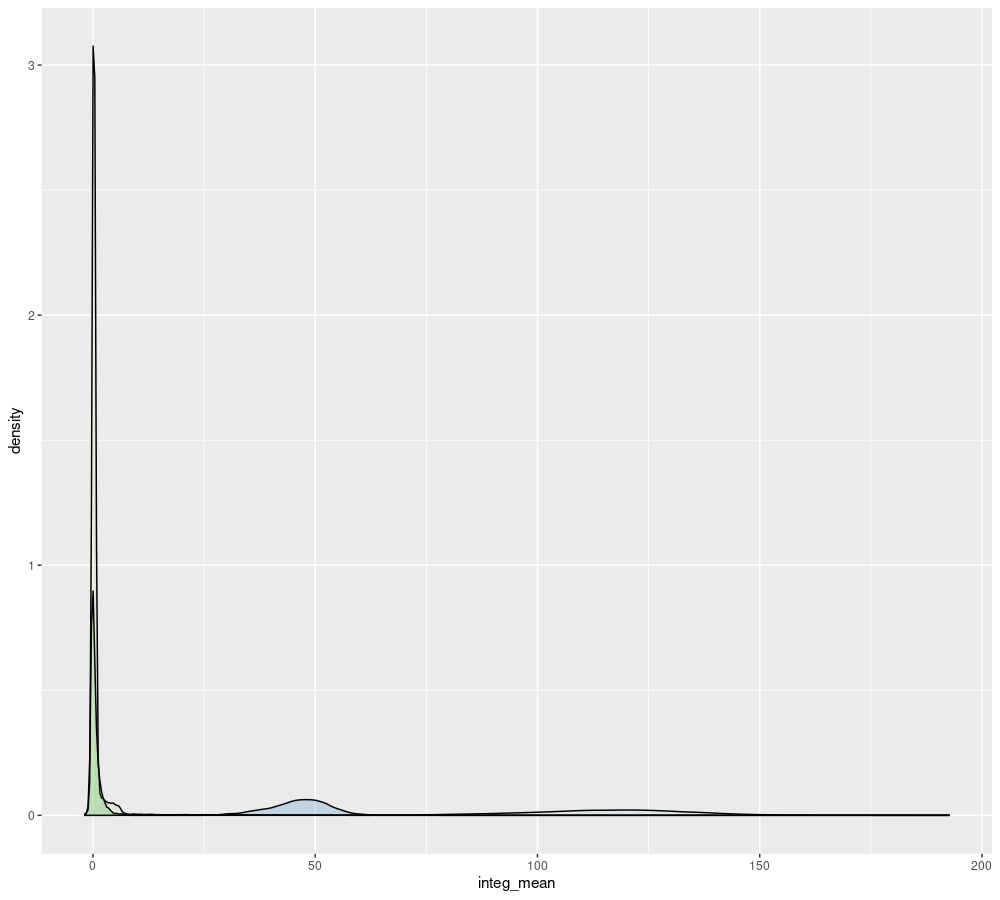

In [8]:
ggplot(df_pulsar) +
    geom_density(aes(x = integ_mean), alpha = .2, fill = dense_colors[1]) +
    geom_density(aes(x = integ_sd), alpha = .2, fill = dense_colors[2]) +
    geom_density(aes(x = integ_exkur), alpha = .2, fill = dense_colors[3]) +
    geom_density(aes(x = integ_skew), alpha = .2, fill = dense_colors[4]) 

In [9]:
set.seed(1)
training <- sample(1:nrow(df_pulsar), size = nrow(df_pulsar) * 0.5)
testing <- dplyr::setdiff(1:nrow(df_pulsar), training)
pulsarTrain <- df_pulsar[training, ]
pulsarTest <- df_pulsar[testing, ]

In [10]:
print(names(df_pulsar))

[1] "integ_mean"  "integ_sd"    "integ_exkur" "integ_skew"  "DMSNR_mean" 
[6] "DMSNR_sd"    "DMSNR_exkur" "DMSNR_skew"  "Class"      


In [103]:
trctrl <- trainControl(method = "repeatedcv", 
                       number = 5, 
                       repeats = 2)

set.seed(2020)

knn_fit1 <- train(Class ~ ., 
                  data = pulsarTrain,
                  method = "knn", 
                  trControl = trctrl, 
                  preProcess = c("center", "scale"), 
                  tuneGrid = data.frame(k = 2:30))

In [104]:
knn_fit1

k-Nearest Neighbors 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

Pre-processing: centered (8), scaled (8) 
Resampling: Cross-Validated (5 fold, repeated 2 times) 
Summary of sample sizes: 7160, 7160, 7159, 7158, 7159, 7159, ... 
Resampling results across tuning parameters:

  k   Accuracy   Kappa    
   2  0.9701091  0.8146248
   3  0.9777630  0.8579131
   4  0.9770364  0.8526425
   5  0.9768132  0.8499049
   6  0.9772601  0.8527123
   7  0.9773719  0.8527162
   8  0.9767572  0.8484055
   9  0.9771482  0.8503951
  10  0.9771482  0.8502244
  11  0.9772600  0.8506623
  12  0.9775953  0.8527327
  13  0.9776513  0.8528811
  14  0.9779305  0.8547778
  15  0.9778747  0.8542528
  16  0.9776513  0.8525332
  17  0.9774836  0.8514377
  18  0.9772601  0.8498059
  19  0.9769807  0.8480103
  20  0.9767013  0.8459534
  21  0.9768130  0.8467799
  22  0.9767571  0.8462744
  23  0.9765336  0.8447155
  24  0.9770366  0.8481821
  25  0.9768689  0.8470086
  26  0.9765337  0.8447390

[1] "The knn misclassification rate is 0.022"

integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew,Class,knnPred,misclass
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<lgl>
140.56250,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,Non Pulsar,Non Pulsar,FALSE
102.50781,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,Non Pulsar,Non Pulsar,FALSE
88.72656,40.67223,0.6008661,1.1234917,1.178930,11.46872,14.269573,252.56731,Non Pulsar,Non Pulsar,FALSE
93.57031,46.69811,0.5319048,0.4167211,1.636288,14.54507,10.621748,131.39400,Non Pulsar,Non Pulsar,FALSE
107.25781,39.49649,0.4658820,1.1628771,4.079431,24.98042,7.397080,57.78474,Non Pulsar,Non Pulsar,FALSE
142.07812,45.28807,-0.3203284,0.2839525,5.376254,29.00990,6.076266,37.83139,Non Pulsar,Non Pulsar,FALSE




|           | Non Pulsar| Pulsar|
|:----------|----------:|------:|
|Non Pulsar |       8069|    153|
|Pulsar     |         43|    684|

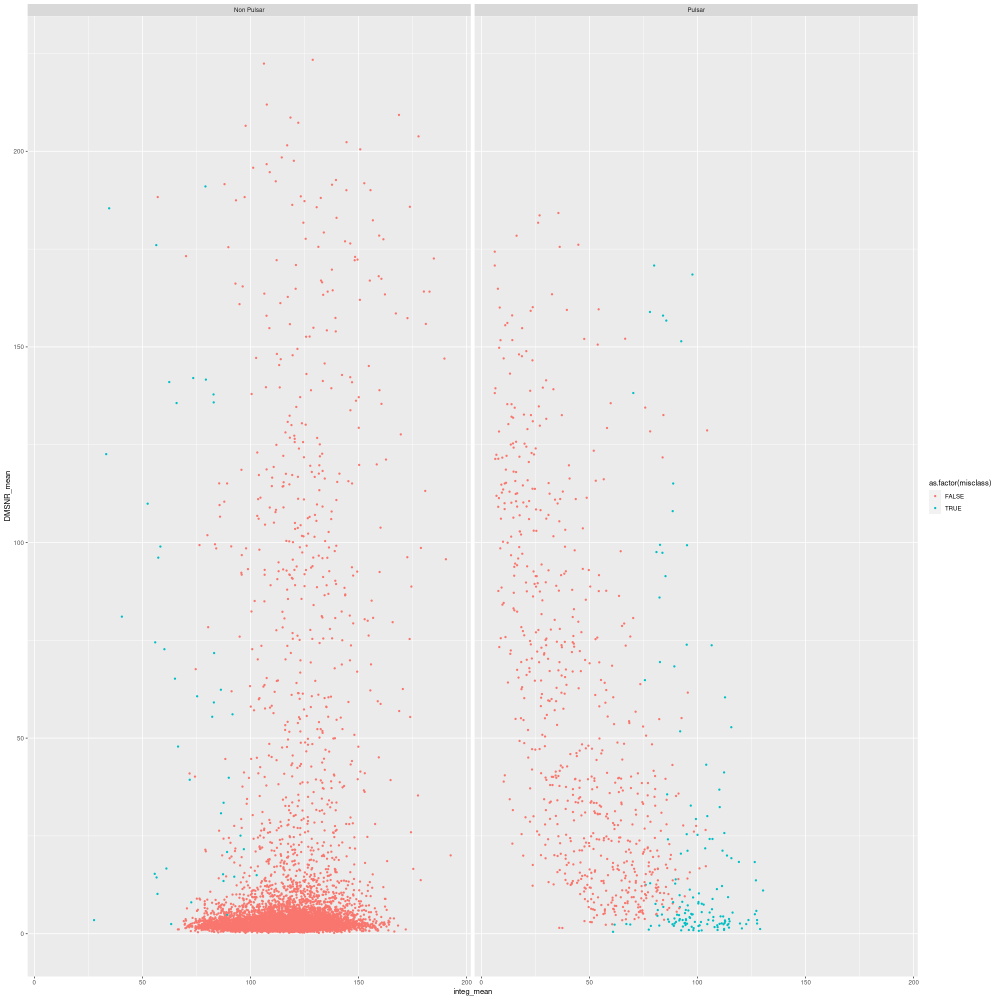

In [105]:
set.seed(100)
knn_pred1 <- predict(knn_fit1, newdata = pulsarTest)

knn_misclass <- sum(knn_pred1 != pulsarTest$Class)/nrow(pulsarTest)

sprintf("The knn misclassification rate is %0.3f" , knn_misclass)

pulsarTest2 <- pulsarTest %>% select(everything()) %>% mutate(knnPred = knn_pred1, misclass = knnPred != Class)
head(pulsarTest2)

pulsarTest2 %>% ggplot(aes(x = integ_mean, y = DMSNR_mean, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class)

knitr::kable(table(knn_pred1, pulsarTest$Class))

In [106]:
rf_fit <- train(Class ~ ., data = pulsarTrain, method = 'rf',
                preProcess = c('center', 'scale'), importance = TRUE,
                tuneGrid = data.frame(mtry = 1:4))
rf_fit

Random Forest 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

Pre-processing: centered (8), scaled (8) 
Resampling: Bootstrapped (25 reps) 
Summary of sample sizes: 8949, 8949, 8949, 8949, 8949, 8949, ... 
Resampling results across tuning parameters:

  mtry  Accuracy   Kappa    
  1     0.9779984  0.8590031
  2     0.9784742  0.8633342
  3     0.9786796  0.8651405
  4     0.9789365  0.8669411

Accuracy was used to select the optimal model using the largest value.
The final value used for the model was mtry = 4.

[1] "The rf misclassification rate is 0.020"

integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew,Class,knnPred,misclass
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<lgl>
140.56250,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,Non Pulsar,Non Pulsar,FALSE
102.50781,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,Non Pulsar,Non Pulsar,FALSE
88.72656,40.67223,0.6008661,1.1234917,1.178930,11.46872,14.269573,252.56731,Non Pulsar,Non Pulsar,FALSE
93.57031,46.69811,0.5319048,0.4167211,1.636288,14.54507,10.621748,131.39400,Non Pulsar,Non Pulsar,FALSE
107.25781,39.49649,0.4658820,1.1628771,4.079431,24.98042,7.397080,57.78474,Non Pulsar,Non Pulsar,FALSE
142.07812,45.28807,-0.3203284,0.2839525,5.376254,29.00990,6.076266,37.83139,Non Pulsar,Non Pulsar,FALSE




|           | Non Pulsar| Pulsar|
|:----------|----------:|------:|
|Non Pulsar |       8050|    119|
|Pulsar     |         62|    718|

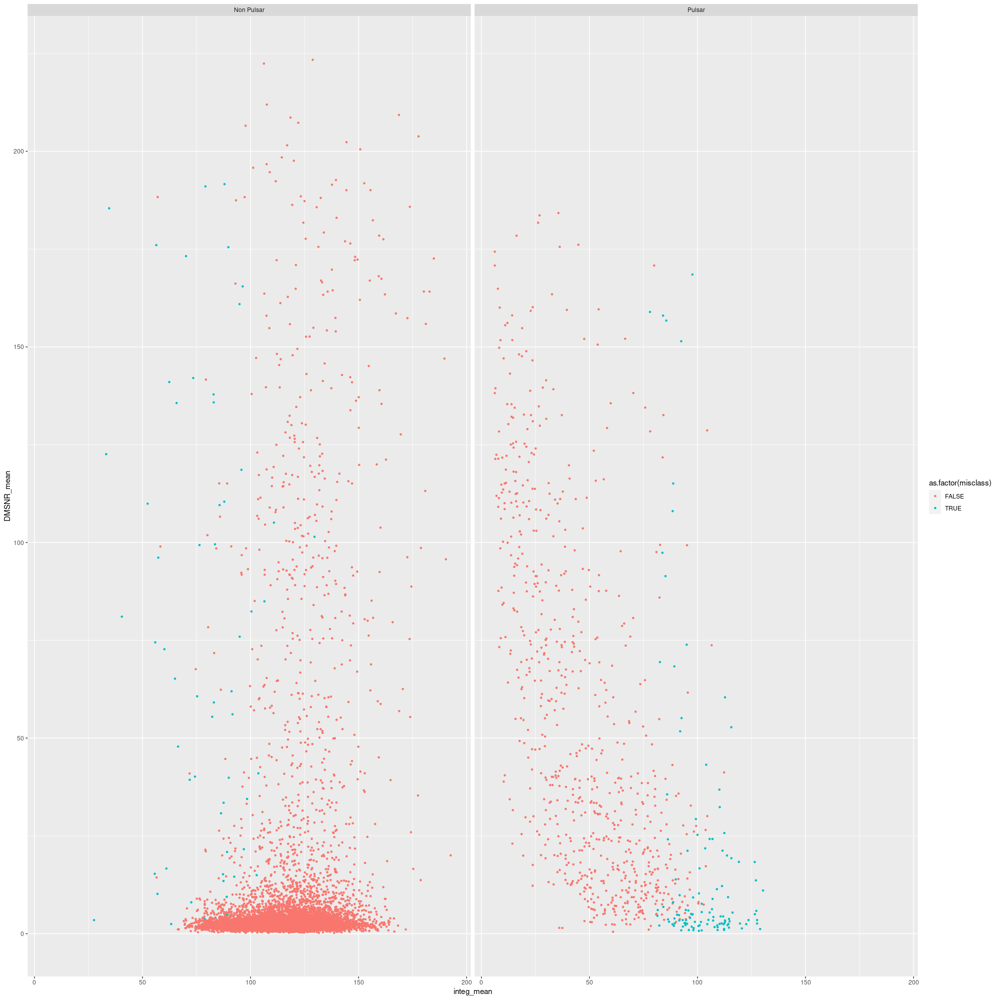

In [107]:
set.seed(100)
rf_pred <- predict(rf_fit, newdata = pulsarTest)

rf_misclass <- sum(rf_pred != pulsarTest$Class)/nrow(pulsarTest)

sprintf("The rf misclassification rate is %0.3f" , rf_misclass)

pulsarTest3 <- pulsarTest %>% select(everything()) %>% mutate(rfPred = rf_pred, misclass = rfPred != Class)
head(pulsarTest2)

pulsarTest3 %>% ggplot(aes(x = integ_mean, y = DMSNR_mean, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class)

knitr::kable(table(rf_pred, pulsarTest$Class))

In [108]:
log_fit <- train(Class ~ ., 
                 method = "glm", 
                 family = "binomial", 
                 data = pulsarTrain, 
                 trControl = trctrl)
log_fit

Generalized Linear Model 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

No pre-processing
Resampling: Cross-Validated (5 fold, repeated 2 times) 
Summary of sample sizes: 7158, 7160, 7158, 7160, 7160, 7158, ... 
Resampling results:

  Accuracy   Kappa    
  0.9786568  0.8610915


In [109]:
summary(log_fit)


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.2964  -0.1665  -0.0993  -0.0558   3.7270  

Coefficients:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -10.095283   1.407801  -7.171 7.45e-13 ***
integ_mean    0.028355   0.008415   3.369 0.000753 ***
integ_sd     -0.028674   0.014495  -1.978 0.047901 *  
integ_exkur   6.522688   0.423035  15.419  < 2e-16 ***
integ_skew   -0.626403   0.051326 -12.204  < 2e-16 ***
DMSNR_mean   -0.022262   0.004688  -4.749 2.05e-06 ***
DMSNR_sd      0.061985   0.010556   5.872 4.30e-09 ***
DMSNR_exkur   0.210063   0.142723   1.472 0.141069    
DMSNR_skew   -0.011123   0.005665  -1.963 0.049595 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 5399.0  on 8948  degrees of freedom
Residual deviance: 1326.1  on 8940  degrees of freedom
AIC: 1344.1

Number of Fisher Scoring iterations: 8


In [110]:
summary(rf_fit)

                Length Class      Mode     
call                5  -none-     call     
type                1  -none-     character
predicted        8949  factor     numeric  
err.rate         1500  -none-     numeric  
confusion           6  -none-     numeric  
votes           17898  matrix     numeric  
oob.times        8949  -none-     numeric  
classes             2  -none-     character
importance         32  -none-     numeric  
importanceSD       24  -none-     numeric  
localImportance     0  -none-     NULL     
proximity           0  -none-     NULL     
ntree               1  -none-     numeric  
mtry                1  -none-     numeric  
forest             14  -none-     list     
y                8949  factor     numeric  
test                0  -none-     NULL     
inbag               0  -none-     NULL     
xNames              8  -none-     character
problemType         1  -none-     character
tuneValue           1  data.frame list     
obsLevels           2  -none-   

In [111]:
names(rf_fit)

[1] "method"       "modelInfo"    "modelType"    "results"      "pred"        
 [6] "bestTune"     "call"         "dots"         "metric"       "control"     
[11] "finalModel"   "preProcess"   "trainingData" "resample"     "resampledCM" 
[16] "perfNames"    "maximize"     "yLimits"      "times"        "levels"      
[21] "terms"        "coefnames"    "xlevels"

In [112]:
rf_fit$finalModel


Call:
 randomForest(x = x, y = y, mtry = min(param$mtry, ncol(x)), importance = TRUE) 
               Type of random forest: classification
                     Number of trees: 500
No. of variables tried at each split: 4

        OOB estimate of  error rate: 2.02%
Confusion matrix:
           Non Pulsar Pulsar class.error
Non Pulsar       8091     56 0.006873696
Pulsar            125    677 0.155860349

In [113]:
rf_fit$results

,mtry,Accuracy,Kappa,AccuracySD,KappaSD
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0.9779984,0.8590031,0.002372954,0.01333767
2,2,0.9784742,0.8633342,0.002384034,0.01360099
3,3,0.9786796,0.8651405,0.002542140,0.01439027
4,4,0.9789365,0.8669411,0.002374748,0.01392193


randomForest 4.6-14

Type rfNews() to see new features/changes/bug fixes.


Attaching package: ‘randomForest’


The following object is masked from ‘package:dplyr’:

    combine


The following object is masked from ‘package:ggplot2’:

    margin




            Non Pulsar     Pulsar
DMSNR_skew    0.000000   0.000000
DMSNR_exkur   8.371588   8.371588
integ_skew   11.342590  11.342590
integ_sd     13.055038  13.055038
DMSNR_mean   15.612807  15.612807
integ_mean   15.923323  15.923323
DMSNR_sd     19.784980  19.784980
integ_exkur 100.000000 100.000000


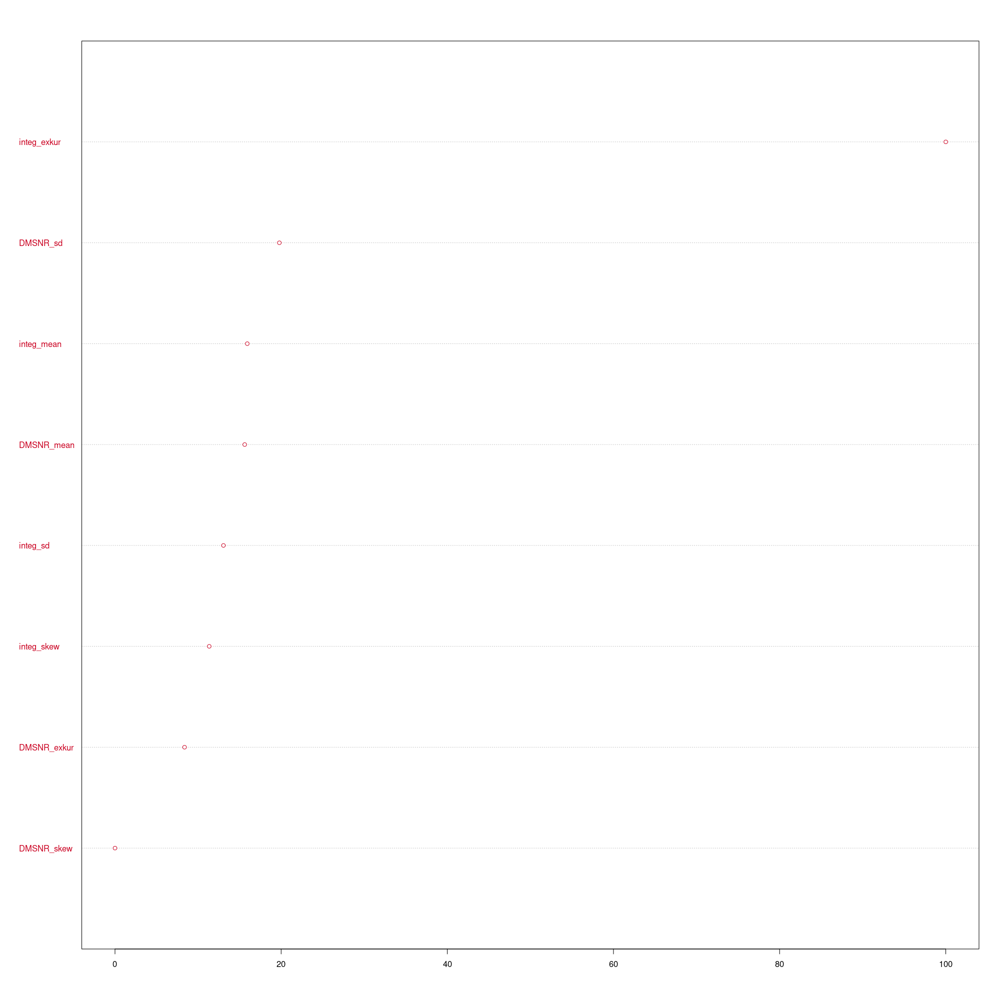

In [114]:
library(randomForest)

var_imp <- varImp(rf_fit, scale = TRUE)

var_imp <- as.data.frame(var_imp$importance)

var_imp <- var_imp[order(var_imp[[2]]), ]

print(var_imp)

dotchart(var_imp[[1]], labels = row.names(var_imp), col = dense_colors[5])

In [115]:
PCA_pulsar <- prcomp(select(df_pulsar, integ_mean:DMSNR_skew) , scale = TRUE)

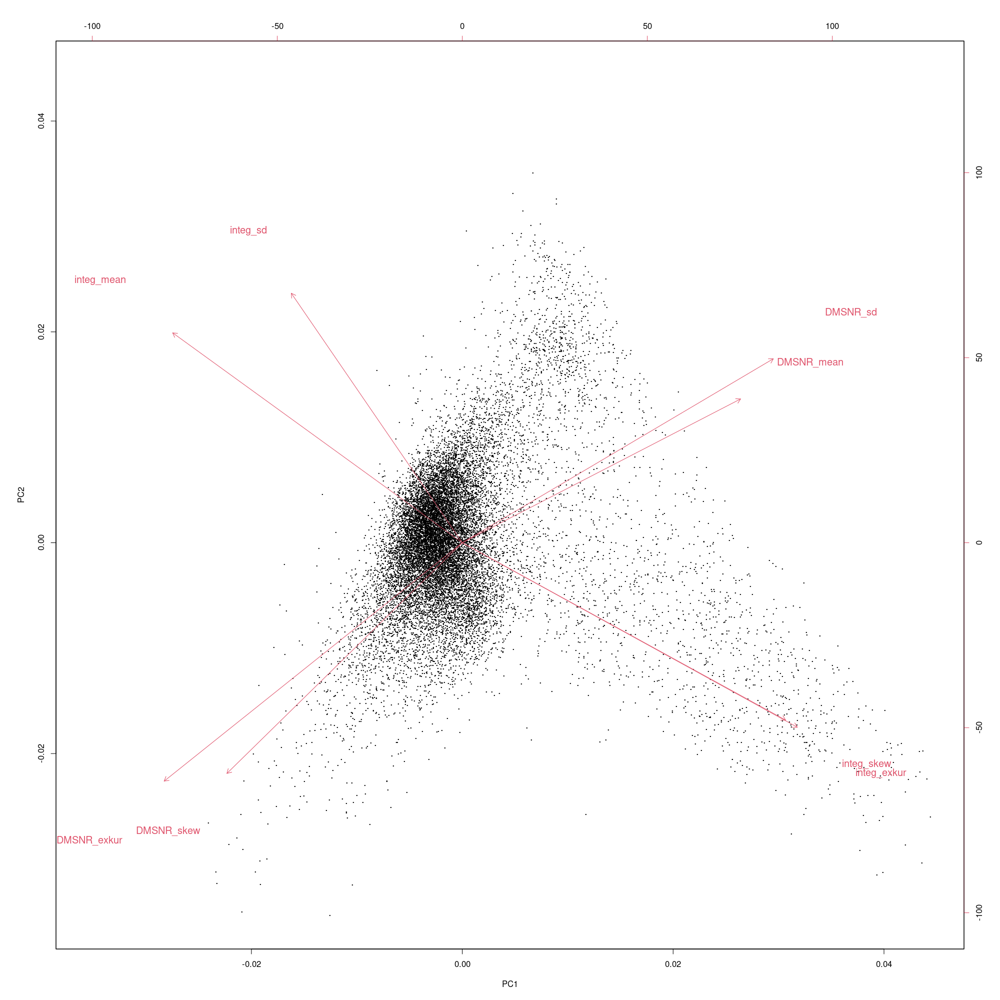

In [116]:
biplot(PCA_pulsar, xlabs = rep(".", nrow(df_pulsar)), cex = 1.2)

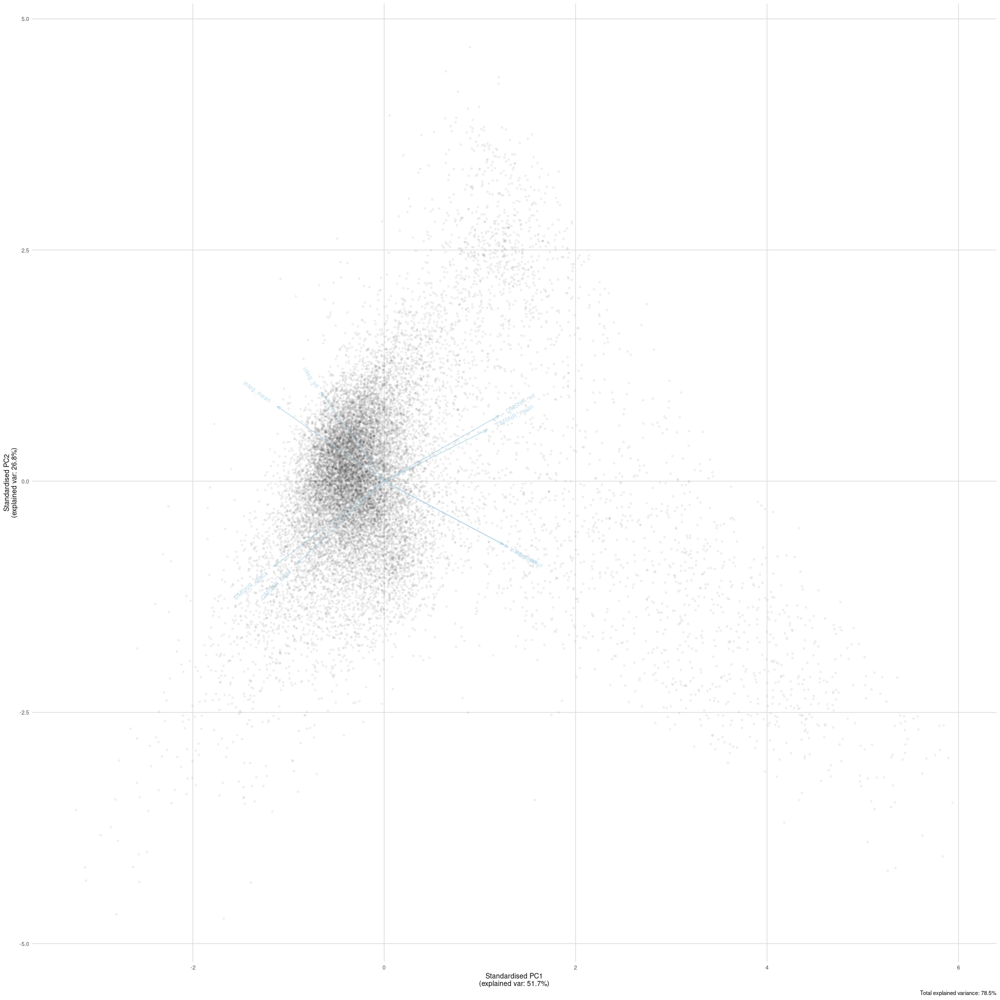

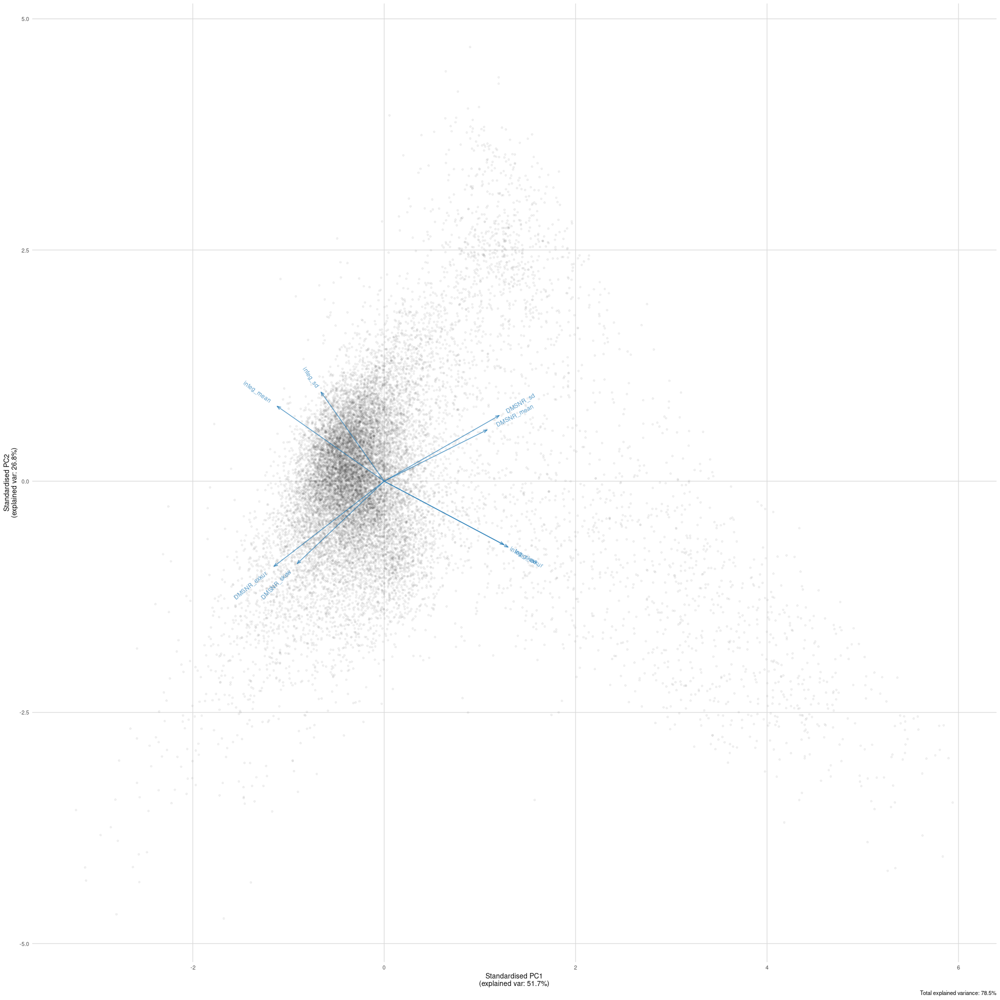

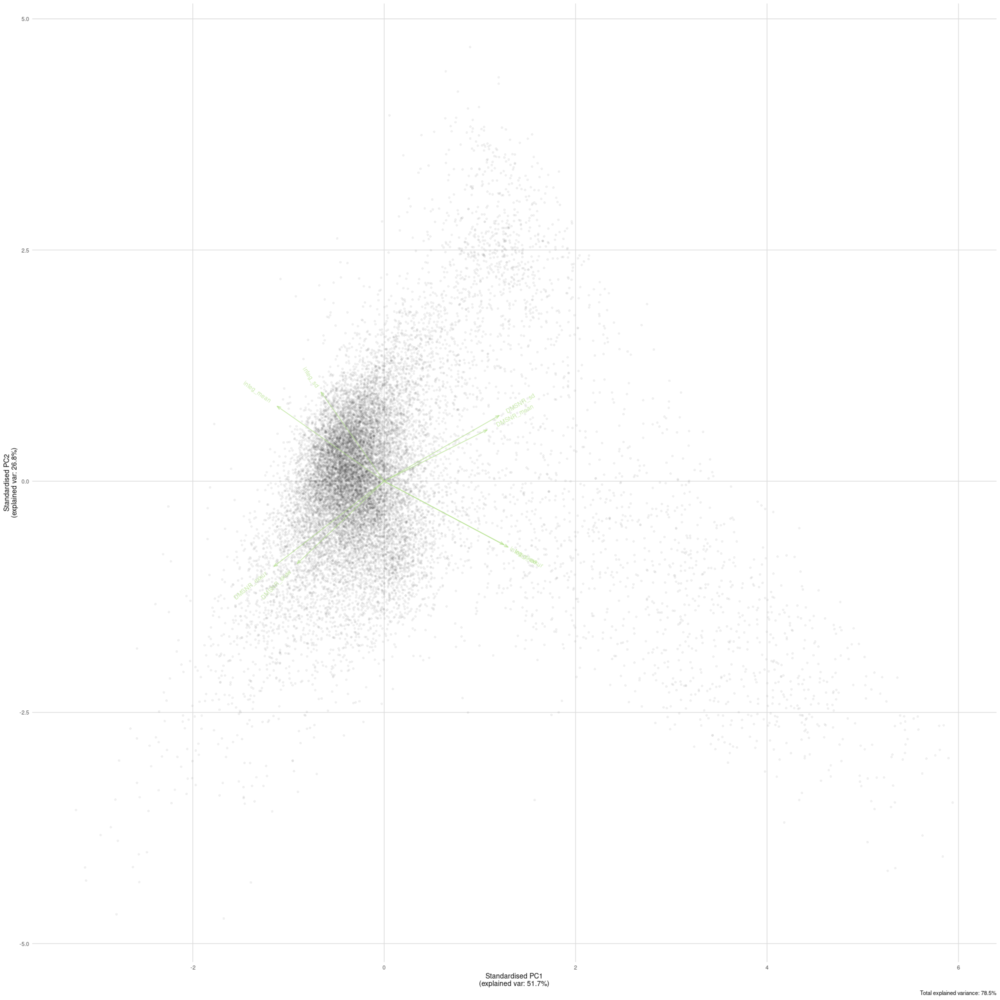

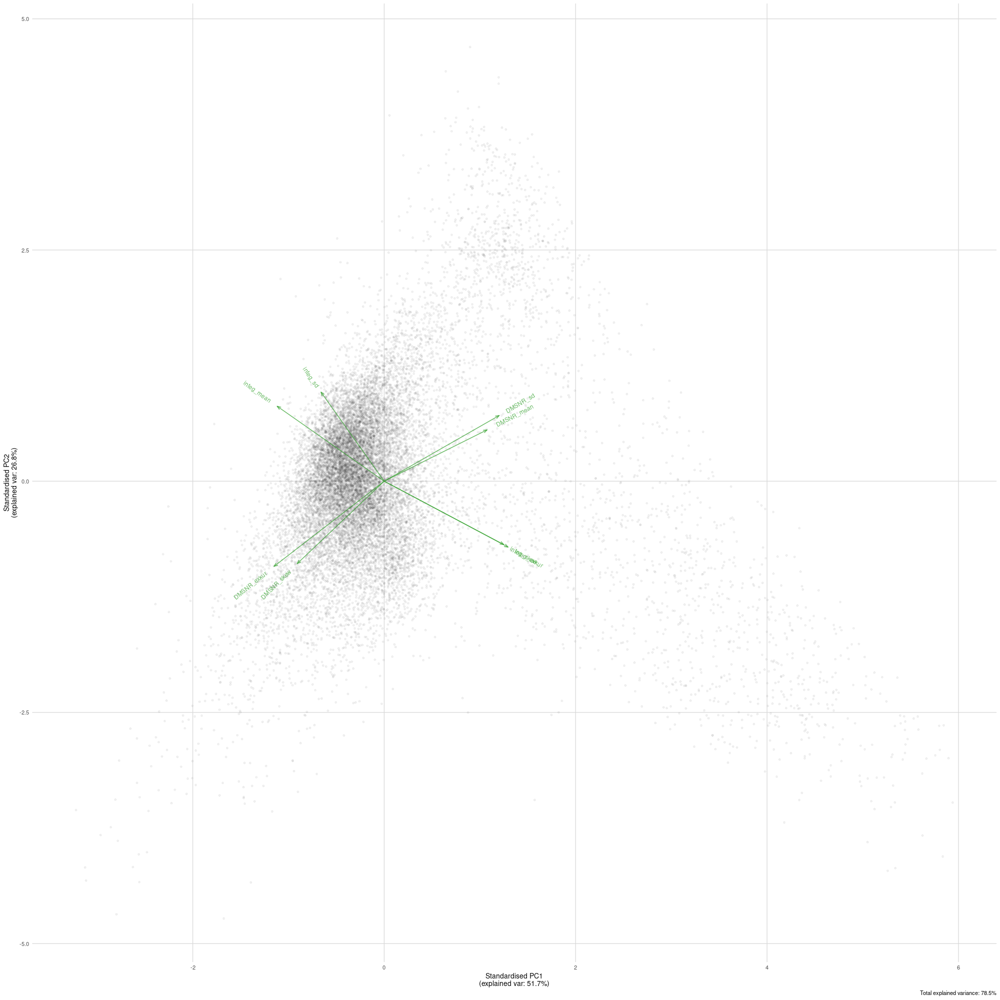

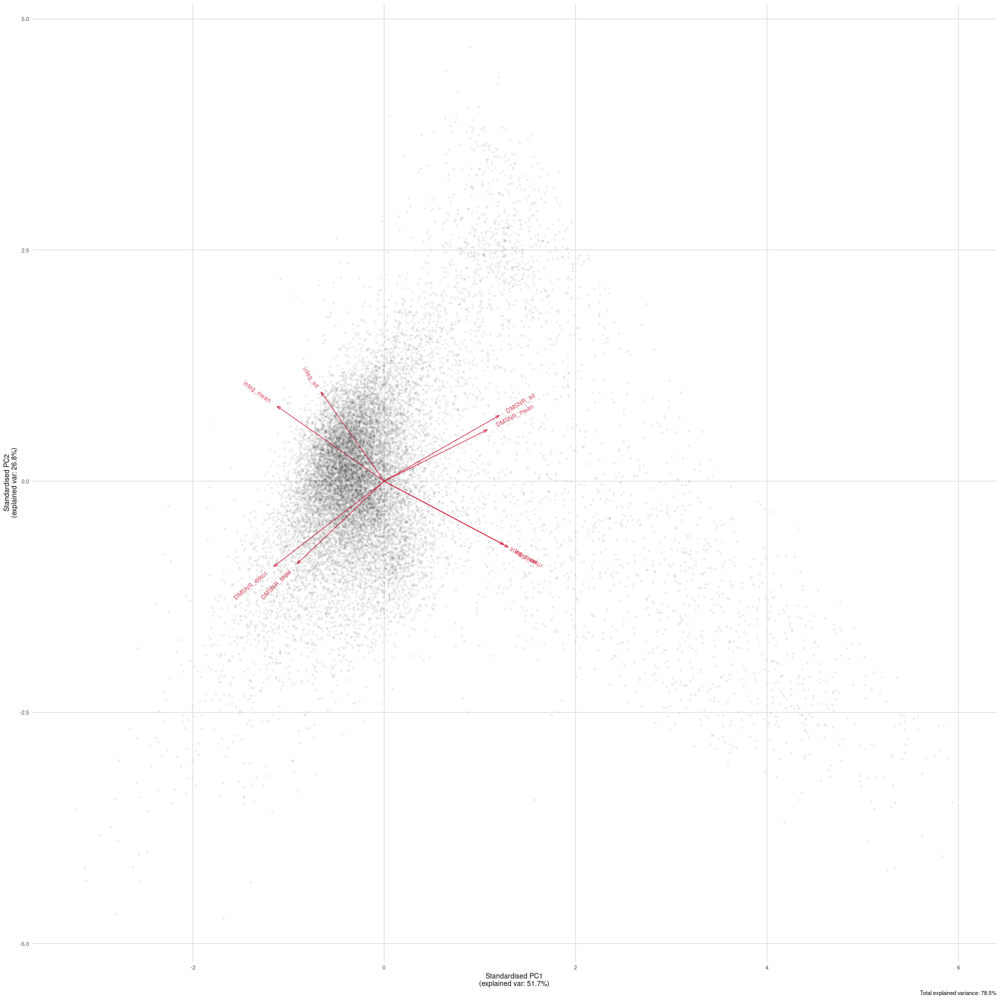

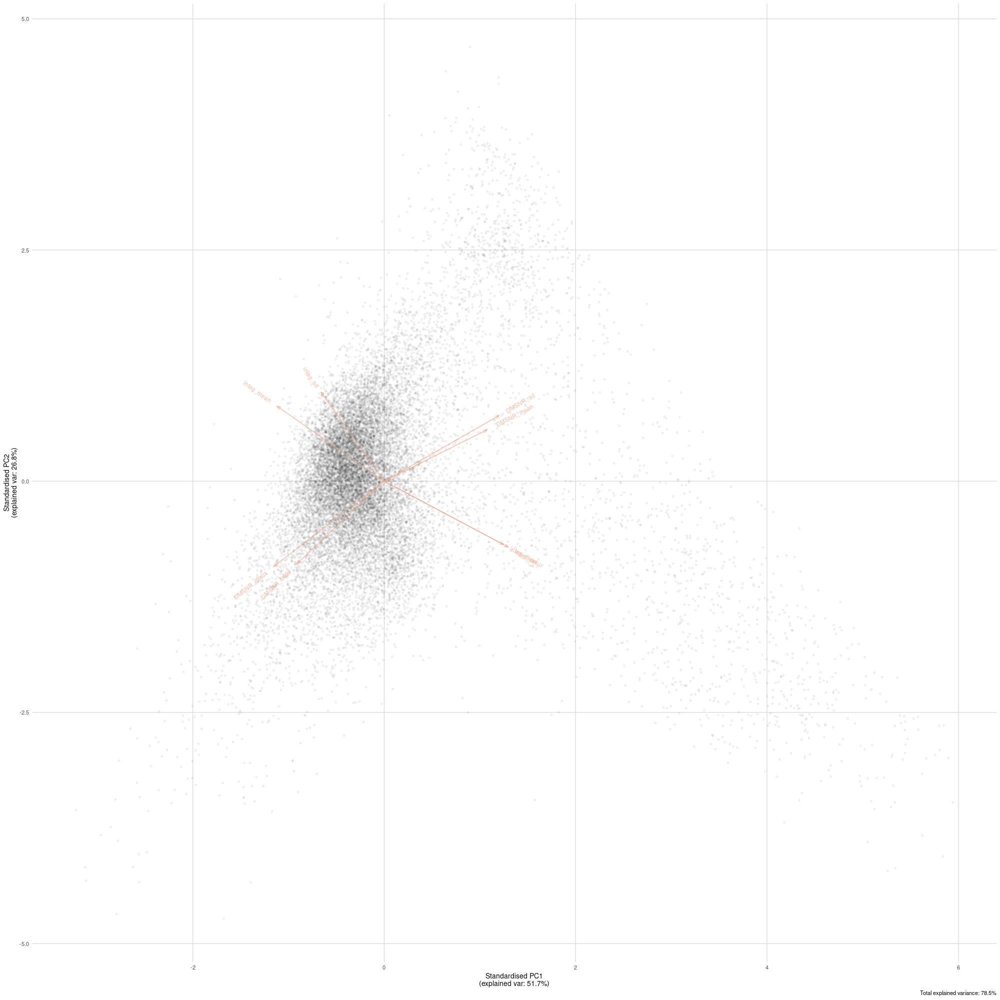

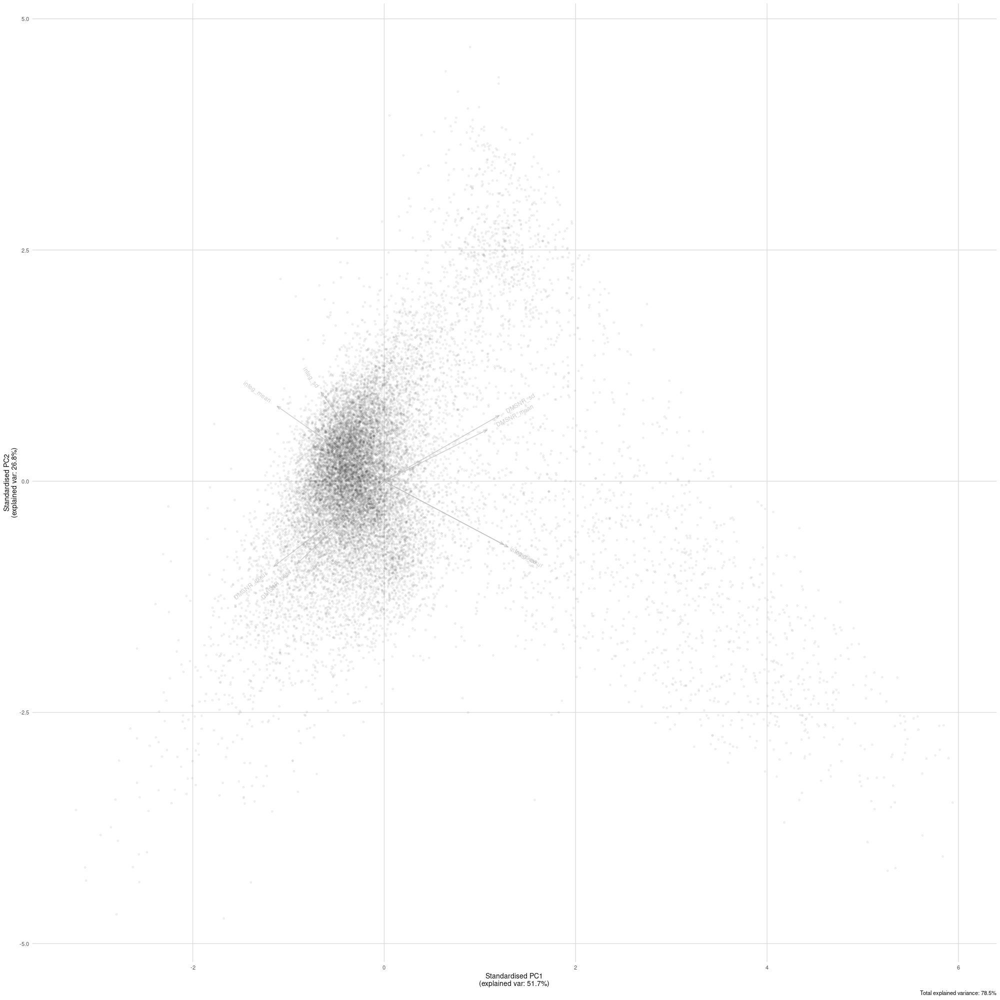

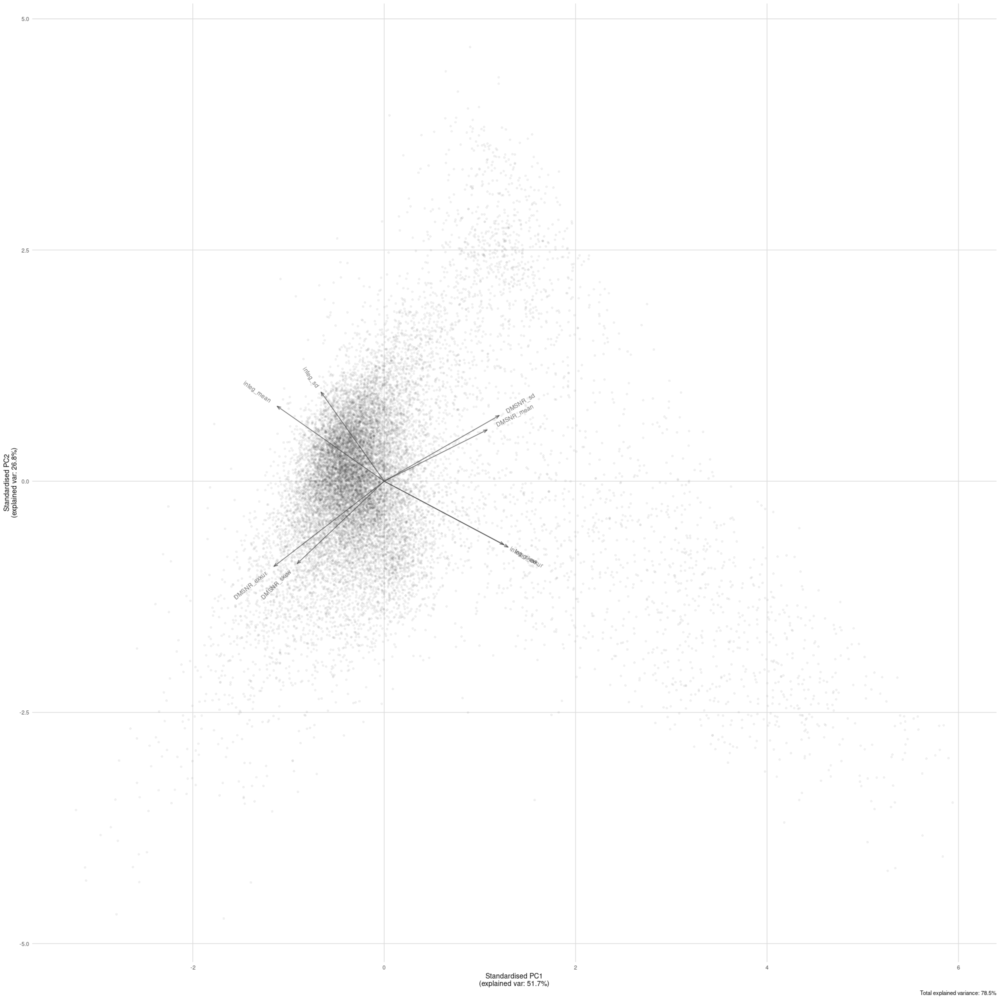

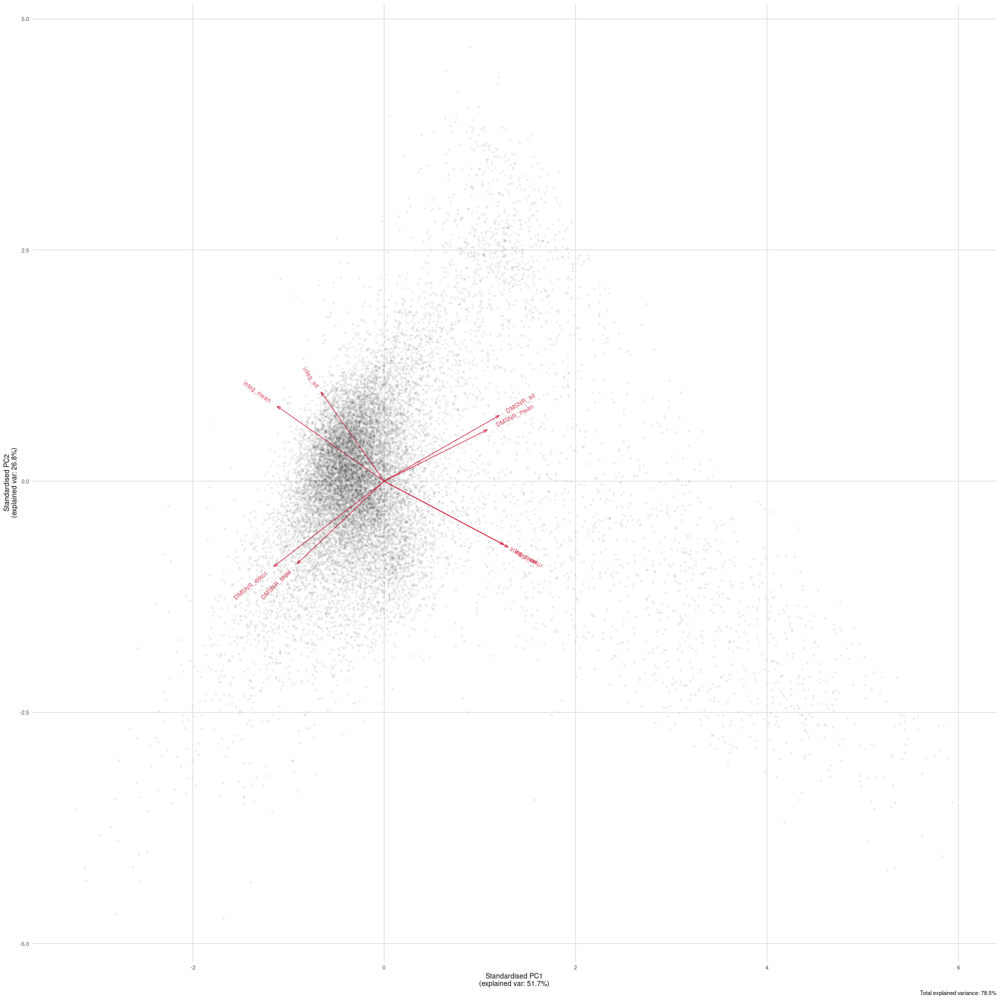

In [117]:
library(AMR)

#c('#a6cee3','#1f78b4','#b2df8a','#33a02c', '#ca0020','#f4a582','#bababa','#404040')

for(i in dense_colors){
    print(ggplot_pca(PCA_pulsar, points_size = 1,
                     points_alpha = 0.05,
                     arrows = TRUE,
                     arrows_colour = i,)
          )
}

ggplot_pca(PCA_pulsar, points_size = 1,
           points_alpha = 0.05,
           arrows = TRUE,
           arrows_colour = dense_colors[5],)

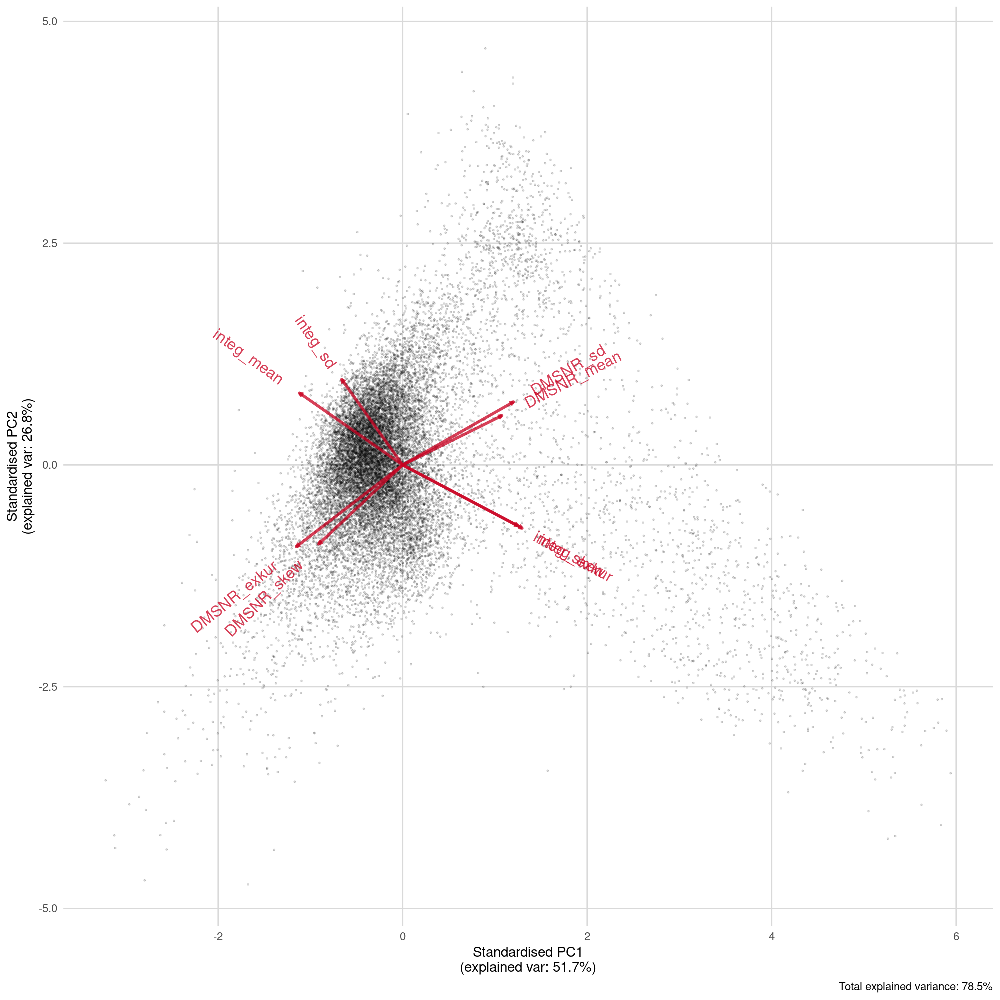

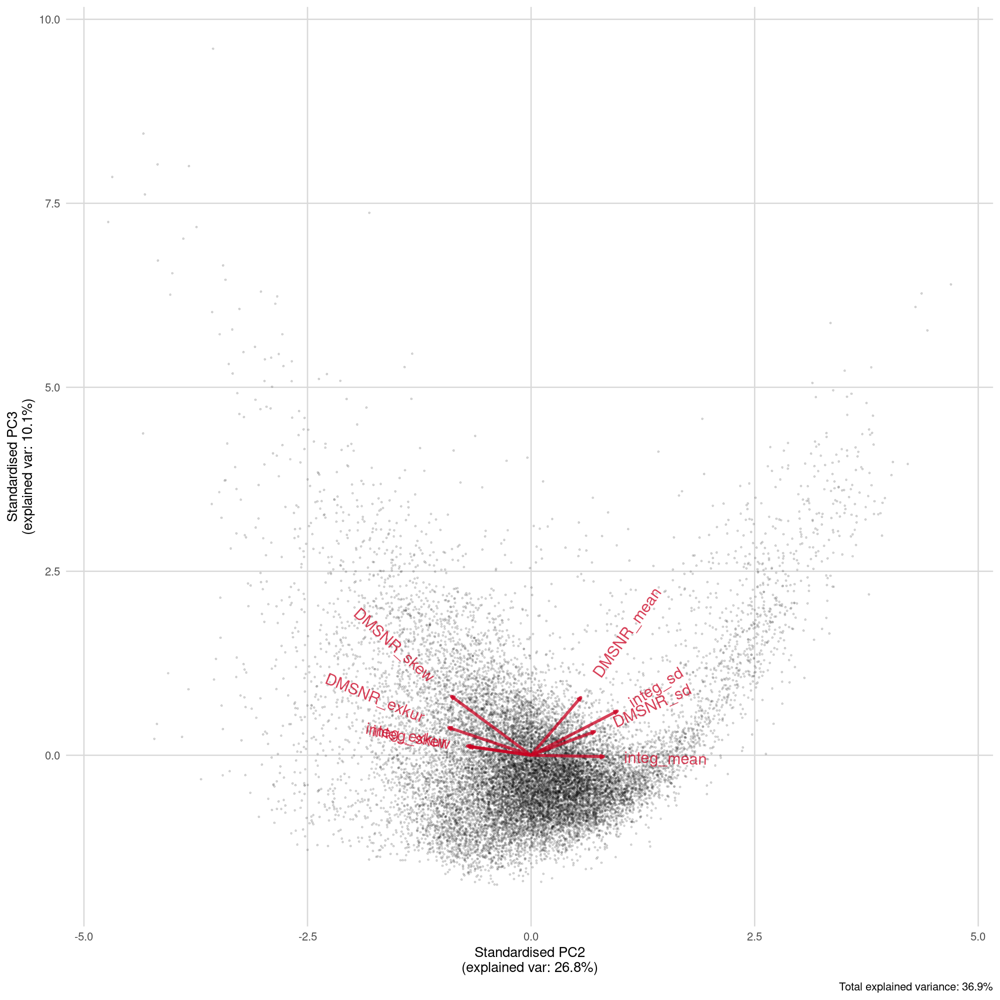

In [240]:
options(repr.plot.width = 20, repr.plot.height = 20, repr.plot.res = 100)

ggplot_pca(PCA_pulsar, 
           choices = 1:2, 
           points_size = 1,
           points_alpha = 0.15,
           arrows = TRUE,
           arrows_colour = dense_colors[5],
           arrows_size = 2,
           arrows_textsize = 8,
           arrows_textangled = TRUE,
           arrows_alpha = 0.75,
           base_textsize = 20)

ggplot_pca(PCA_pulsar, 
           choices = c(2.0,3.0), 
           points_size = 1,
           points_alpha = 0.15,
           arrows = TRUE,
           arrows_colour = dense_colors[5],
           arrows_size = 2,
           arrows_textsize = 8,
           arrows_textangled = TRUE,
           arrows_alpha = 0.75,
           base_textsize = 20)

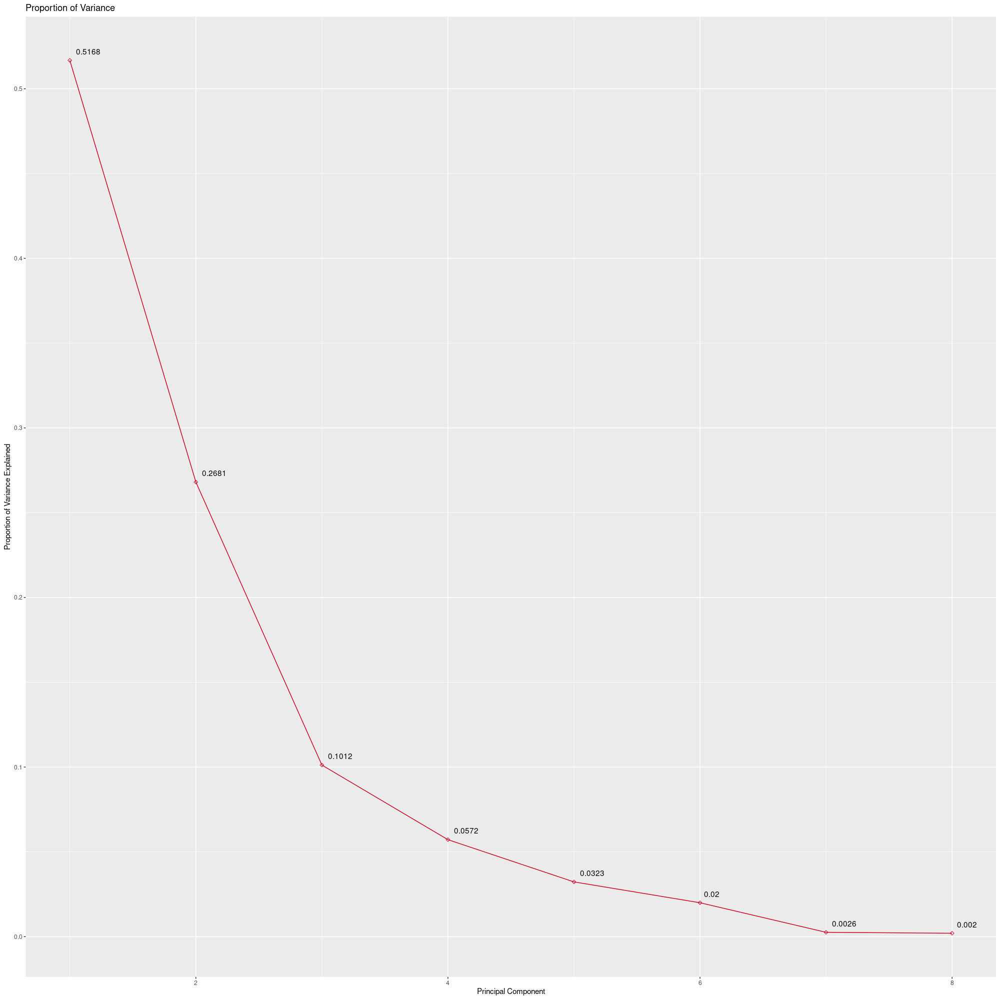

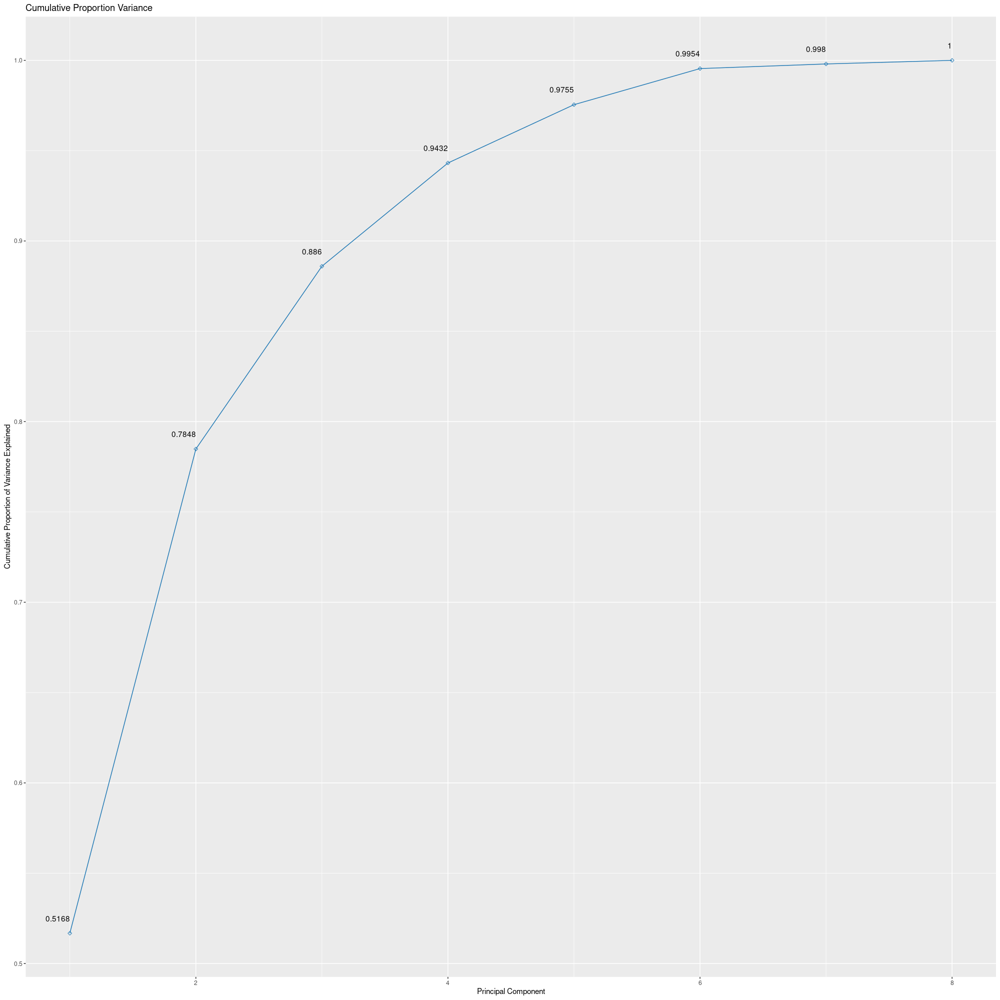

In [169]:
df_pca_plot <- as_tibble(cbind(1:8, PCA_pulsar$sdev^2))

colnames(df_pca_plot) <- c("PCA", "variance")

#df_pca_plot %>% print()

df_pca_plot %>% ggplot(aes(x = PCA, y = variance/sum(variance))) + geom_point(shape = 5, col = dense_colors[5]) + 
                                                                   geom_line(col = dense_colors[5]) + labs(x = "Principal Component", 
                                                                                      y = "Proportion of Variance Explained",
                                                                                      title = "Proportion of Variance") +
                                                                   geom_text(aes(x = PCA, 
                                                                                 y = variance/sum(variance), 
                                                                                 label = round(variance/sum(variance), 4),
                                                                                 hjust = -0.25,
                                                                                 vjust = -1))

df_pca_plot %>% ggplot(aes(x = PCA, y = cumsum(variance/sum(variance)))) + geom_point(shape = 5, col = dense_colors[2]) + 
                                                                           geom_line(col = dense_colors[2]) + labs(x = "Principal Component", 
                                                                                              y = "Cumulative Proportion of Variance Explained",
                                                                                              title = "Cumulative Proportion Variance") +
                                                                           geom_text(aes(x = PCA, 
                                                                                         y = cumsum(variance/sum(variance)), 
                                                                                         label = round(cumsum(variance/sum(variance)), 4),
                                                                                         hjust = 1,
                                                                                         vjust = -2))

In [24]:
names(PCA_pulsar)

[1] "sdev"     "rotation" "center"   "scale"    "x"

In [232]:
PCA_pulsar$sdev
PCA_pulsar$rotation
PCA_tab <- data.frame(cbind(PCA_pulsar$rotation, "Means" = PCA_pulsar$center, "Standard Deviation" = PCA_pulsar$sdev), row.names = proper_names)

print(round(PCA_tab,3))

[1] 2.0332355 1.4644470 0.8996382 0.6763319 0.5081603 0.3998491 0.1429753
[8] 0.1265948

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
integ_mean,-0.3596622,0.3618849,-0.01325276,-0.29225602,0.74434976,-0.01841197,-0.31459003,-0.027033145
integ_sd,-0.2123480,0.4302135,0.43643440,0.75678826,0.01895864,-0.04607132,0.06416928,-0.004641837
integ_exkur,0.4161365,-0.3181397,0.09173293,0.30304693,0.14615196,-0.05228488,-0.77303907,-0.060676591
integ_skew,0.4014866,-0.3057701,0.08346561,0.17789768,0.64361070,0.02074329,0.53965092,0.028477027
DMSNR_mean,0.3456256,0.2479177,0.57038435,-0.33242329,-0.07333901,0.60719734,-0.02631342,-0.092068394
DMSNR_sd,0.3863212,0.3172270,0.23420002,-0.25773213,-0.06594445,-0.75165549,0.06107319,-0.236184030
DMSNR_exkur,-0.3702155,-0.4110223,0.27334335,-0.03798298,0.00344466,-0.01531573,0.05065127,-0.784238385
DMSNR_skew,-0.2922836,-0.3977587,0.58229150,-0.19999783,-0.01580270,-0.24589691,-0.03339184,0.561663372


                                 PC1    PC2    PC3    PC4    PC5    PC6    PC7
Integrated Mean               -0.360  0.362 -0.013 -0.292  0.744 -0.018 -0.315
Integrated Standard Deviation -0.212  0.430  0.436  0.757  0.019 -0.046  0.064
Integrated Kurtosis            0.416 -0.318  0.092  0.303  0.146 -0.052 -0.773
Intergrated Skew               0.401 -0.306  0.083  0.178  0.644  0.021  0.540
DMSNR Mean                     0.346  0.248  0.570 -0.332 -0.073  0.607 -0.026
DMSNR Standard Deviation       0.386  0.317  0.234 -0.258 -0.066 -0.752  0.061
DMSNR Kurtosis                -0.370 -0.411  0.273 -0.038  0.003 -0.015  0.051
DMSNR Skew                    -0.292 -0.398  0.582 -0.200 -0.016 -0.246 -0.033
                                 PC8   Means Standard.Deviation
Integrated Mean               -0.027 111.080              2.033
Integrated Standard Deviation -0.005  46.550              1.464
Integrated Kurtosis           -0.061   0.478              0.900
Intergrated Skew               0.

# A tibble: 17,898 x 4
   integ_sd DMSNR_mean Class      cluster
      <dbl>      <dbl> <fct>        <int>
 1     55.7      3.20  Non Pulsar       2
 2     58.9      1.68  Non Pulsar       2
 3     39.3      3.12  Non Pulsar       1
 4     57.2      3.64  Non Pulsar       2
 5     40.7      1.18  Non Pulsar       1
 6     46.7      1.64  Non Pulsar       2
 7     48.8      0.999 Non Pulsar       2
 8     39.8      1.22  Non Pulsar       1
 9     52.6      2.33  Non Pulsar       2
10     39.5      4.08  Non Pulsar       1
# … with 17,888 more rows


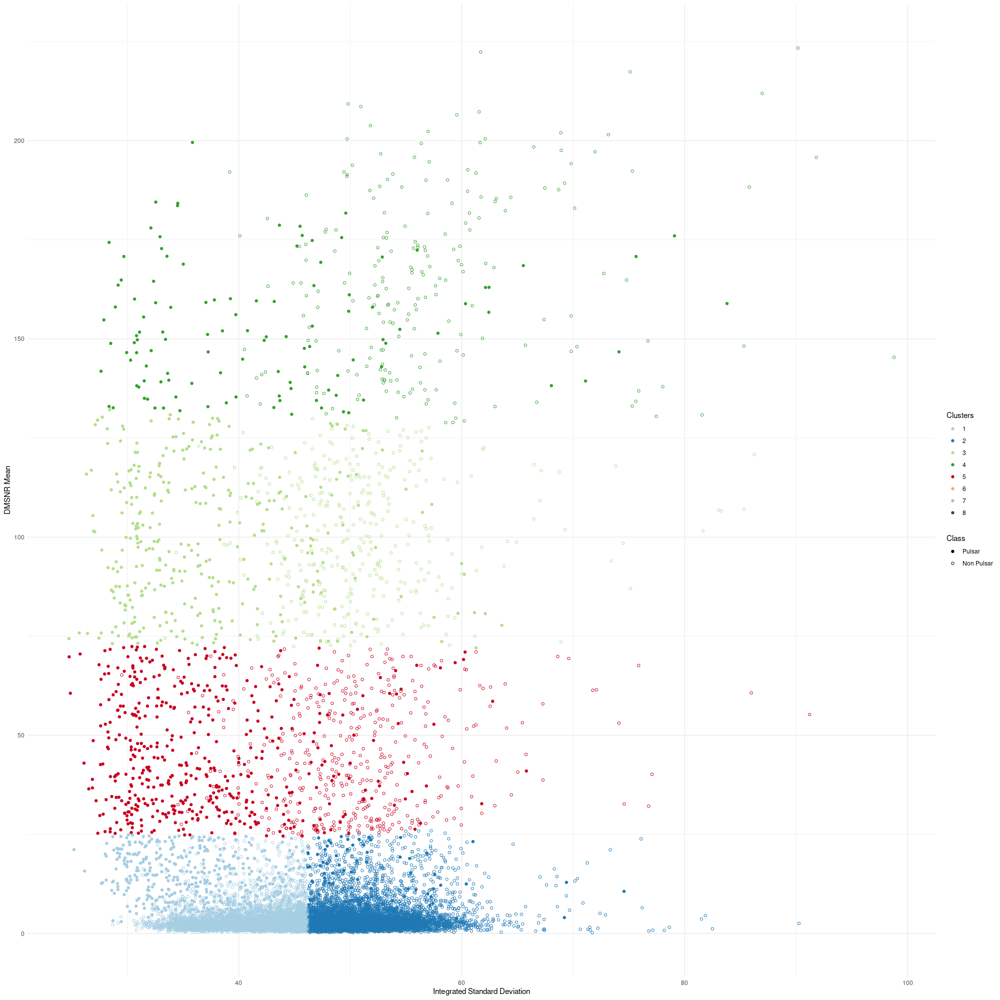

In [210]:
#Kmeans
set.seed(800)

plot_var <- c("integ_sd", "DMSNR_mean", "Class")

proper_names <- c("Integrated Mean", "Integrated Standard Deviation", 
                  "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                  "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

km_pulsar <- kmeans(df_pulsar[ , plot_var[1:2]], 5, nstart = 5)

#plot(df_pulsar[ , plot_var[1:2]], col = (km_pulsar$cluster + 1))

df_kplot <- as_tibble(cbind(df_pulsar[ , plot_var], km_pulsar$cluster))

names(df_kplot)[4] <- "cluster"

df_kplot %>% print()

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8]),
                                name = "Clusters") +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() +
             labs(x = proper_names[which(plot_var[1] == names(df_pulsar))], 
                  y = proper_names[which(plot_var[2] == names(df_pulsar))])

         x         y
1 49.66605 134.26781
2 48.86959 150.39727
3 49.88276 122.20331
4 38.22873  55.00754
5 43.76506  98.67168
6 47.37417 110.81269
7 34.01220  24.70778
8 39.87406  83.28902


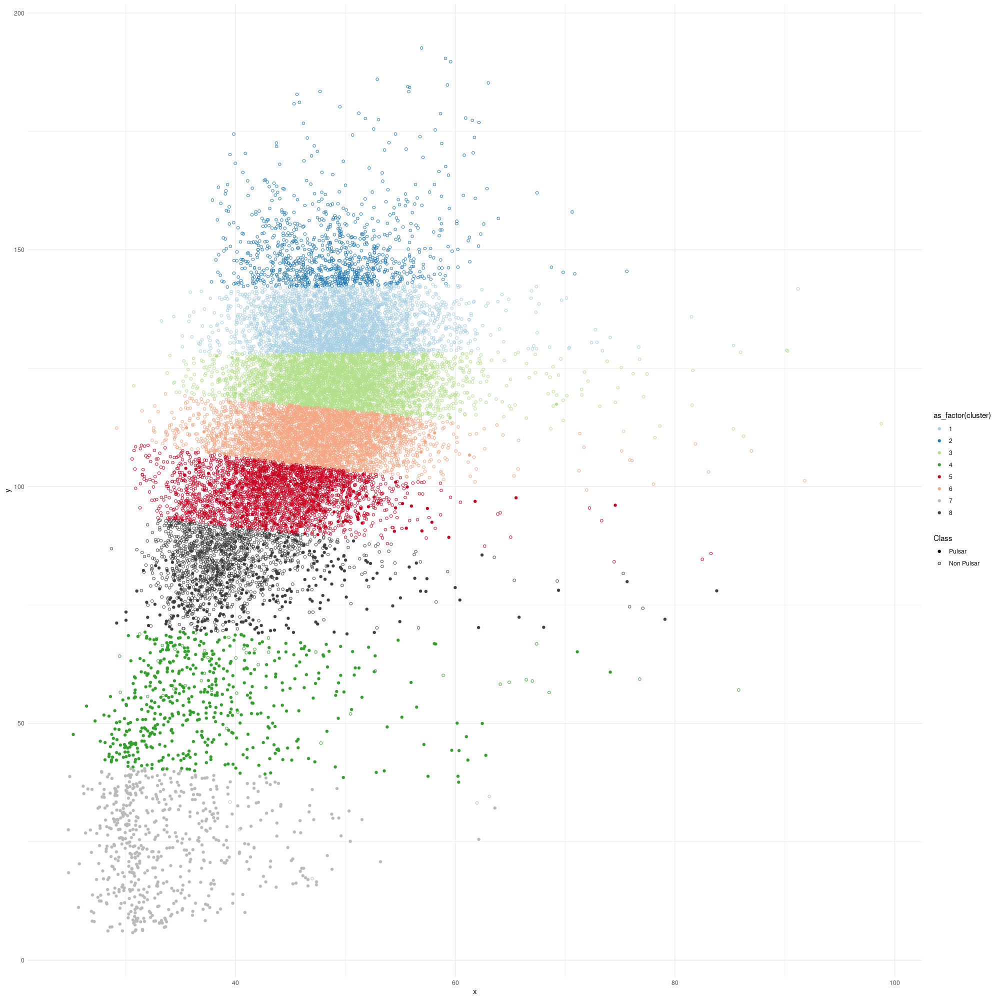

In [199]:
km_centers <- data.frame(km_pulsar$centers)

names(km_centers) = c("x", "y")

print(km_centers)

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8])) +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() #+
             #geom_point(data = km_centers, aes(x = x, y = y))

In [30]:
#Kmeans
set.seed(800)

options(repr.plot.width = 20, repr.plot.height = 20, repr.plot.res = 100)

plot_var <- c("integ_mean", "integ_sd", "Class")

proper_names <- c("Integrated Mean", "Integrated Standard Deviation", 
                  "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                  "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

km_pulsar <- kmeans(df_pulsar[ ,7:9], 8, nstart = 5)

#plot(df_pulsar[ , plot_var[1:2]], col = (km_pulsar$cluster + 1))

df_kplot <- as_tibble(cbind(df_pulsar[ , plot_var], km_pulsar$cluster))

names(df_kplot)[4] <- "cluster"

df_kplot %>% print()

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8]),
                                name = "Clusters") +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() +
             labs(x = proper_names[which(plot_var[1] == names(df_pulsar))], 
                  y = proper_names[which(plot_var[2] == names(df_pulsar))])

Warning message in storage.mode(x) <- "double":
“NAs introduced by coercion”


ERROR: Error in do_one(nmeth): NA/NaN/Inf in foreign function call (arg 1)


In [17]:
km_pulsar <- kmeans(df_pulsar[ , 1:8], 5, nstart = 5)

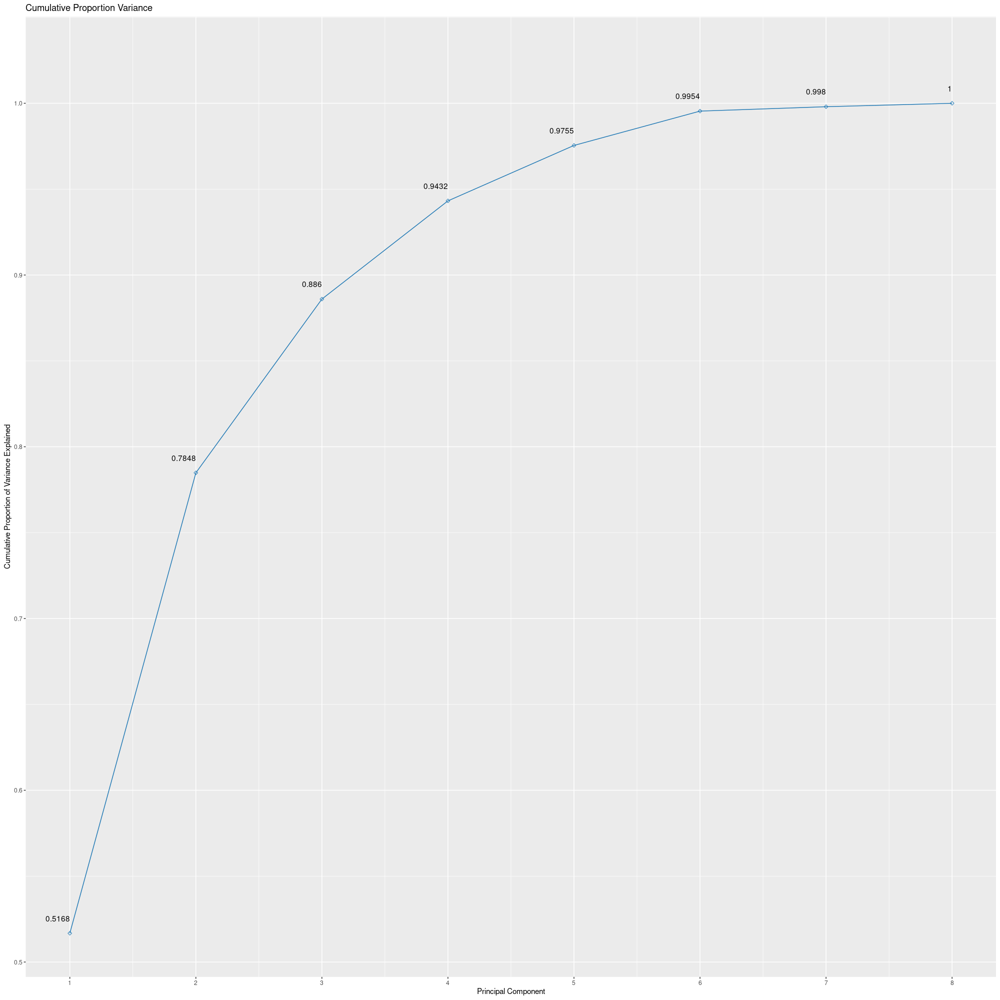

In [223]:
df_pca_plot %>% ggplot(aes(x = PCA, y = cumsum(variance/sum(variance)))) + geom_point(shape = 5, col = dense_colors[2]) + 
                                                                           geom_line(col = dense_colors[2]) + labs(x = "Principal Component", 
                                                                                              y = "Cumulative Proportion of Variance Explained",
                                                                                              title = "Cumulative Proportion Variance") +
                                                                           geom_text(aes(x = PCA, 
                                                                                         y = cumsum(variance/sum(variance)), 
                                                                                         label = round(cumsum(variance/sum(variance)), 4),
                                                                                         hjust = 1,
                                                                                         vjust = -2)) +
                                                                            ylim(NA, 1.025) + 
                                                                            scale_x_continuous(breaks = seq(0, 8, 1))

In [16]:
str(df_pulsar)

tibble [17,898 × 9] (S3: tbl_df/tbl/data.frame)
 $ integ_mean : num [1:17898] 140.6 102.5 103 136.8 88.7 ...
 $ integ_sd   : num [1:17898] 55.7 58.9 39.3 57.2 40.7 ...
 $ integ_exkur: num [1:17898] -0.2346 0.4653 0.3233 -0.0684 0.6009 ...
 $ integ_skew : num [1:17898] -0.7 -0.515 1.051 -0.636 1.123 ...
 $ DMSNR_mean : num [1:17898] 3.2 1.68 3.12 3.64 1.18 ...
 $ DMSNR_sd   : num [1:17898] 19.1 14.9 21.7 21 11.5 ...
 $ DMSNR_exkur: num [1:17898] 7.98 10.58 7.74 6.9 14.27 ...
 $ DMSNR_skew : num [1:17898] 74.2 127.4 63.2 53.6 252.6 ...
 $ Class      : Factor w/ 2 levels "Non Pulsar","Pulsar": 1 1 1 1 1 1 1 1 1 1 ...


In [237]:
setdiff(a, b)
setdiff(b, a)

[1] "a" "b" "c"

[1] "g" "h"